# Los Angeles crimes analysis #

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mtl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import os
import folium
import json
from branca.colormap import linear
from folium.plugins import MarkerCluster
from folium.plugins import Fullscreen
from __future__ import print_function
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
#from sklearn import linear_model
#from sklearn.svm import SVR
#import scipy as sp
#import scipy.stats

pd.options.mode.chained_assignment = None

We **upload the L.A. crimes data in a dataframe**.

In [2]:
LAcrimes = os.path.join('data', 'City of Los Angeles Crime_Data_From_2010_to_Present.csv')
df = pd.read_csv(LAcrimes,delimiter=';')
df

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Desc,MO Codes,...,Weapon Desc,Status Code,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Address,Cross Street,Location
0,100220871,11/13/2010,11/12/2010,1200,2,Rampart,271,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,JAMES M WOOD,LAKE,"(34.0539, -118.2799)"
1,100416450,10/14/2010,10/14/2010,1200,4,Hollenbeck,422,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,N BROADWAY,JOHNSON,"(0, 0)"
2,100506372,02/17/2010,02/09/2010,1600,5,Harbor,563,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,16TH,GAFFEY,"(33.7297, -118.2924)"
3,100516503,08/31/2010,08/30/2010,2300,5,Harbor,562,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,LELAND,14TH,"(33.7315, -118.3012)"
4,100516679,09/05/2010,09/04/2010,1330,5,Harbor,506,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,213TH,DENKER,"(33.8355, -118.3039)"
5,100100501,01/03/2010,01/02/2010,2100,1,Central,176,122,"RAPE, ATTEMPTED",400,...,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,122.0,NaN,NaN,NaN,8TH ST,SAN PEDRO ST,"(34.0387, -118.2488)"
6,100100506,01/05/2010,01/04/2010,1650,1,Central,162,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),0344 1402,...,NaN,AA,Adult Arrest,442.0,NaN,NaN,NaN,700 W 7TH ST,NaN,"(34.048, -118.2577)"
7,100100508,01/08/2010,01/07/2010,2005,1,Central,182,330,BURGLARY FROM VEHICLE,344,...,NaN,IC,Invest Cont,330.0,NaN,NaN,NaN,PICO BL,GRAND AV,"(34.0389, -118.2643)"
8,100100509,01/09/2010,01/08/2010,2100,1,Central,157,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",416,...,UNKNOWN WEAPON/OTHER WEAPON,AA,Adult Arrest,230.0,NaN,NaN,NaN,500 CROCKER ST,NaN,"(34.0435, -118.2427)"
9,100100510,01/09/2010,01/09/2010,230,1,Central,171,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0400 0416,...,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,230.0,NaN,NaN,NaN,800 W OLYMPIC BL,NaN,"(34.045, -118.264)"


We **delete from the dataframe all the data regard to years 2010, 2011, 2012 and 2013**. The **only data we need belongs to 2014 and 2015**.

In [3]:
df = df[~df['Date Occurred'].str.contains("2010|2011|2012|2013")]
df

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Desc,MO Codes,...,Weapon Desc,Status Code,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Address,Cross Street,Location
771150,140315532,07/12/2014,07/12/2014,500,3,Southwest,318,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,22ND,MAGNOLIA,"(34.036, -118.2865)"
771695,140406977,03/17/2014,03/16/2014,2200,4,Hollenbeck,453,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,BOYLE,BRIDGE,"(34.0523, -118.2174)"
789627,140106191,02/02/2014,02/02/2014,430,1,Central,156,350,"THEFT, PERSON",0305 0346,...,NaN,IC,Invest Cont,350.0,NaN,NaN,NaN,6TH,SAN JULIAN,"(34.0423, -118.2452)"
790103,140106193,02/02/2014,01/30/2014,2330,1,Central,171,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,OLYMPIC,GEORGIA,"(34.0459, -118.2657)"
790223,140106296,02/04/2014,02/03/2014,1830,1,Central,195,310,BURGLARY,344,...,NaN,IC,Invest Cont,310.0,NaN,NaN,NaN,16TH ST,SANTEE,"(34.0321, -118.2599)"
790402,140107528,02/21/2014,01/29/2014,2200,1,Central,171,354,THEFT OF IDENTITY,1822,...,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,900 W OLYMPIC BL,NaN,"(34.0454, -118.2657)"
790460,140112327,05/12/2014,05/02/2014,400,1,Central,192,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,1400 S GRAND AV,NaN,"(34.0372, -118.2654)"
790501,140112843,05/21/2014,05/20/2014,1900,1,Central,111,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,HILL,CESAR E CHAVEZ,"(34.0592, -118.2411)"
790780,140113180,05/26/2014,05/26/2014,1735,1,Central,182,664,"BUNCO, PETTY THEFT",0800 1402 0344,...,NaN,IC,Invest Cont,664.0,998.0,NaN,NaN,11TH,FLOWER,"(34.043, -118.2641)"
790961,140114407,06/12/2014,06/12/2014,750,1,Central,159,510,VEHICLE - STOLEN,NaN,...,NaN,IC,Invest Cont,510.0,NaN,NaN,NaN,800 E 4TH ST,NaN,"(34.0433, -118.2377)"


We noticed that inside the dataframe **there are victims with sex *X* and *H***. **Since we don't know the exact meaning of that (if it is and error or not) we delete all the rows which has that values and we mantain only the rows with victim sex *M* (Male) and *F* (Female)**. Furthermore **we replace all NaN inside the column "Victim Sex" with the label *U* (Unknown)**.

In [4]:
df['Victim Sex'].value_counts()

M    116587
F    106169
X      3699
H         7
Name: Victim Sex, dtype: int64

In [5]:
df['Victim Sex'].fillna("U", inplace=True)

df = df[~df['Victim Sex'].str.contains("X|H")]

In [6]:
df['Victim Sex'].value_counts()

M    116587
F    106169
U     21299
Name: Victim Sex, dtype: int64

**There are rows with victim age less than 1**. Of curse **it is and error so we delete all the ages less than 1**.

In [7]:
df[df['Victim Age'] < 0]['Victim Age']

989469   -1
990431   -1
993568   -1
993659   -1
993997   -1
994173   -1
994293   -1
994298   -1
994300   -1
994301   -1
994302   -1
994306   -1
994307   -1
994330   -1
994362   -1
994426   -1
994479   -1
994489   -1
994612   -1
994621   -1
994688   -1
994699   -1
994911   -2
Name: Victim Age, dtype: int64

In [8]:
df = df[~df['Victim Age'] < 0]

In [9]:
df[df['Victim Age'] < 0]['Victim Age']

Series([], Name: Victim Age, dtype: int64)

In the next rows **we fix all the dates inside the dataframe**. **All the dates are strings and we want them as *timestamp***.

In [10]:
print (df[df['Time Occurred'] < 100])

         DR Number Date Reported Date Occurred  Time Occurred  Area ID  \
791362   140115001    06/22/2014    06/20/2014              1        1   
800856   130801740    01/01/2014    01/01/2014             40        8   
800871   140100529    01/11/2014    01/11/2014             30        1   
800872   140100530    01/11/2014    01/11/2014             30        1   
800904   140100587    02/07/2014    02/07/2014             20        1   
800906   140100598    02/09/2014    02/09/2014             30        1   
800941   140100689    03/15/2014    03/15/2014             35        1   
800967   140100759    04/02/2014    04/02/2014             20        1   
800972   140100773    04/10/2014    04/10/2014             30        1   
800985   140100802    04/18/2014    04/18/2014             35        1   
800990   140100808    04/20/2014    04/20/2014             15        1   
800991   140100809    04/21/2014    04/21/2014             15        1   
801001   140100828    04/27/2014    04

In [11]:
df['Time Occurred'] = df['Time Occurred'].astype(str)
df['Time Occurred'] = df['Time Occurred'].apply(lambda x: x.zfill(4))
df['Time Occurred']

771150     0500
771695     2200
789627     0430
790103     2330
790223     1830
790402     2200
790460     0400
790501     1900
790780     1735
790961     0750
791100     1530
791262     1515
791362     0001
791441     2300
791482     1530
792262     0830
792502     1750
792542     0200
792641     1544
792878     1545
792898     2149
793660     0230
793839     1530
793980     2200
794220     2230
795449     2100
795796     1700
795858     0330
797879     2100
798199     2130
           ... 
1048545    1000
1048546    1709
1048547    1455
1048548    0545
1048549    1300
1048550    2100
1048551    1500
1048552    1930
1048553    2345
1048554    1800
1048555    1600
1048556    2100
1048557    2300
1048558    2200
1048559    1700
1048560    0635
1048561    0800
1048562    1200
1048563    1500
1048564    0001
1048565    1800
1048566    2230
1048567    1600
1048568    0135
1048569    0800
1048570    2215
1048571    1340
1048572    0410
1048573    0001
1048574    1900
Name: Time Occurred, dty

In [12]:
df['Date-Time Occured'] = df["Date Occurred"].map(str) + " " + df["Time Occurred"].map(str)
df['Date-Time Occured']

771150     07/12/2014 0500
771695     03/16/2014 2200
789627     02/02/2014 0430
790103     01/30/2014 2330
790223     02/03/2014 1830
790402     01/29/2014 2200
790460     05/02/2014 0400
790501     05/20/2014 1900
790780     05/26/2014 1735
790961     06/12/2014 0750
791100     06/15/2014 1530
791262     06/15/2014 1515
791362     06/20/2014 0001
791441     06/29/2014 2300
791482     07/01/2014 1530
792262     08/09/2014 0830
792502     10/25/2014 1750
792542     10/30/2014 0200
792641     10/31/2014 1544
792878     11/17/2014 1545
792898     11/24/2014 2149
793660     07/16/2014 0230
793839     07/21/2014 1530
793980     08/07/2014 2200
794220     08/23/2014 2230
795449     08/27/2014 2100
795796     09/21/2014 1700
795858     09/25/2014 0330
797879     12/10/2014 2100
798199     12/10/2014 2130
                ...       
1048545    06/21/2015 1000
1048546    06/18/2015 1709
1048547    06/22/2015 1455
1048548    06/22/2015 0545
1048549    06/26/2015 1300
1048550    06/21/2015 2100
1

In [13]:
df['Date-Time Occured'] = pd.to_datetime(df['Date-Time Occured'])
df['Date-Time Occured']

771150    2014-07-12 05:00:00
771695    2014-03-16 22:00:00
789627    2014-02-02 04:30:00
790103    2014-01-30 23:30:00
790223    2014-02-03 18:30:00
790402    2014-01-29 22:00:00
790460    2014-05-02 04:00:00
790501    2014-05-20 19:00:00
790780    2014-05-26 17:35:00
790961    2014-06-12 07:50:00
791100    2014-06-15 15:30:00
791262    2014-06-15 15:15:00
791362    2014-06-20 00:01:00
791441    2014-06-29 23:00:00
791482    2014-07-01 15:30:00
792262    2014-08-09 08:30:00
792502    2014-10-25 17:50:00
792542    2014-10-30 02:00:00
792641    2014-10-31 15:44:00
792878    2014-11-17 15:45:00
792898    2014-11-24 21:49:00
793660    2014-07-16 02:30:00
793839    2014-07-21 15:30:00
793980    2014-08-07 22:00:00
794220    2014-08-23 22:30:00
795449    2014-08-27 21:00:00
795796    2014-09-21 17:00:00
795858    2014-09-25 03:30:00
797879    2014-12-10 21:00:00
798199    2014-12-10 21:30:00
                  ...        
1048545   2015-06-21 10:00:00
1048546   2015-06-18 17:09:00
1048547   

In [14]:
df['Date Reported'] = pd.to_datetime(df['Date Reported'])

In [15]:
df

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Desc,MO Codes,...,Status Code,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Address,Cross Street,Location,Date-Time Occured
771150,140315532,2014-07-12,07/12/2014,0500,3,Southwest,318,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,22ND,MAGNOLIA,"(34.036, -118.2865)",2014-07-12 05:00:00
771695,140406977,2014-03-17,03/16/2014,2200,4,Hollenbeck,453,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,BOYLE,BRIDGE,"(34.0523, -118.2174)",2014-03-16 22:00:00
789627,140106191,2014-02-02,02/02/2014,0430,1,Central,156,350,"THEFT, PERSON",0305 0346,...,IC,Invest Cont,350.0,NaN,NaN,NaN,6TH,SAN JULIAN,"(34.0423, -118.2452)",2014-02-02 04:30:00
790103,140106193,2014-02-02,01/30/2014,2330,1,Central,171,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,OLYMPIC,GEORGIA,"(34.0459, -118.2657)",2014-01-30 23:30:00
790223,140106296,2014-02-04,02/03/2014,1830,1,Central,195,310,BURGLARY,344,...,IC,Invest Cont,310.0,NaN,NaN,NaN,16TH ST,SANTEE,"(34.0321, -118.2599)",2014-02-03 18:30:00
790402,140107528,2014-02-21,01/29/2014,2200,1,Central,171,354,THEFT OF IDENTITY,1822,...,IC,Invest Cont,354.0,NaN,NaN,NaN,900 W OLYMPIC BL,NaN,"(34.0454, -118.2657)",2014-01-29 22:00:00
790460,140112327,2014-05-12,05/02/2014,0400,1,Central,192,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,1400 S GRAND AV,NaN,"(34.0372, -118.2654)",2014-05-02 04:00:00
790501,140112843,2014-05-21,05/20/2014,1900,1,Central,111,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,HILL,CESAR E CHAVEZ,"(34.0592, -118.2411)",2014-05-20 19:00:00
790780,140113180,2014-05-26,05/26/2014,1735,1,Central,182,664,"BUNCO, PETTY THEFT",0800 1402 0344,...,IC,Invest Cont,664.0,998.0,NaN,NaN,11TH,FLOWER,"(34.043, -118.2641)",2014-05-26 17:35:00
790961,140114407,2014-06-12,06/12/2014,0750,1,Central,159,510,VEHICLE - STOLEN,NaN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,800 E 4TH ST,NaN,"(34.0433, -118.2377)",2014-06-12 07:50:00


We noticed also there are **rows with *latitude* and *longitude* at 0**. **We delete such rows because are not Los Angeles coordinates**.

In [16]:
df[df['Location'] == "(0, 0)"]

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Desc,MO Codes,...,Status Code,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Address,Cross Street,Location,Date-Time Occured
793660,140214464,2014-07-20,07/16/2014,0230,2,Rampart,236,330,BURGLARY FROM VEHICLE,0344 1609 1307 0358,...,IC,Invest Cont,330.0,NaN,NaN,NaN,UNION,COURT,"(0, 0)",2014-07-16 02:30:00
801016,140100872,2014-05-10,05/10/2014,2155,1,Central,191,624,BATTERY - SIMPLE ASSAULT,416,...,AO,Adult Other,624.0,NaN,NaN,NaN,OLYMPIC BL,PICO BL,"(0, 0)",2014-05-10 21:55:00
801046,140100944,2014-06-08,06/02/2014,0500,1,Central,100,624,BATTERY - SIMPLE ASSAULT,0416 1202,...,IC,Invest Cont,624.0,NaN,NaN,NaN,2ND,UNKNOWN,"(0, 0)",2014-06-02 05:00:00
801424,140104546,2014-01-08,01/08/2014,1910,1,Central,182,420,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),1300 0344,...,IC,Invest Cont,420.0,NaN,NaN,NaN,CHICK HEARN,PICO,"(0, 0)",2014-01-08 19:10:00
801460,140104671,2014-01-11,01/10/2014,2330,1,Central,159,330,BURGLARY FROM VEHICLE,344,...,IC,Invest Cont,330.0,NaN,NaN,NaN,MATEO ST,PALMERO ST,"(0, 0)",2014-01-10 23:30:00
801532,140104925,2014-01-15,01/14/2014,1730,1,Central,138,940,EXTORTION,NaN,...,AO,Adult Other,940.0,NaN,NaN,NaN,3RD ST,BOYD ST,"(0, 0)",2014-01-14 17:30:00
801575,140105124,2014-01-16,01/16/2014,1930,1,Central,156,930,CRIMINAL THREATS - NO WEAPON DISPLAYED,1251 0443,...,IC,Invest Cont,930.0,NaN,NaN,NaN,5TH ST,JULIAN,"(0, 0)",2014-01-16 19:30:00
801723,140105615,2014-01-24,01/23/2014,1430,1,Central,105,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",0344 1602,...,IC,Invest Cont,341.0,NaN,NaN,NaN,CASANOVA,PARK,"(0, 0)",2014-01-23 14:30:00
801757,140105684,2014-01-26,01/26/2014,0300,1,Central,181,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),329,...,IC,Invest Cont,745.0,NaN,NaN,NaN,LA LIVE WY,W GEORGIA ST,"(0, 0)",2014-01-26 03:00:00
801779,140105741,2014-01-27,01/27/2014,1030,1,Central,111,330,BURGLARY FROM VEHICLE,0345 0344 1609 0321 0327,...,IC,Invest Cont,330.0,NaN,NaN,NaN,FORT MOORE,N HILL ST,"(0, 0)",2014-01-27 10:30:00


In [17]:
df = df[~df['Location'].isin(["(0, 0)"])]
df[df['Location'] == "(0, 0)"]

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Desc,MO Codes,...,Status Code,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Address,Cross Street,Location,Date-Time Occured


Inside the dataframe **the coordinates are in the column "Location" in the form "(latitude, longitude)"**. **We want to separate all the coordinates in two different column "Lat" and "Lon" with just the corresponding value of latitudes and longitudes**.

In [18]:
df['Location'] = df['Location'].map(lambda x: x.strip('()'))
df['Location']

771150      34.036, -118.2865
771695     34.0523, -118.2174
789627     34.0423, -118.2452
790103     34.0459, -118.2657
790223     34.0321, -118.2599
790402     34.0454, -118.2657
790460     34.0372, -118.2654
790501     34.0592, -118.2411
790780      34.043, -118.2641
790961     34.0433, -118.2377
791100     34.0481, -118.2507
791262     34.0478, -118.2502
791362      34.0454, -118.236
791441     34.0423, -118.2561
791482      34.0502, -118.254
792262     34.0487, -118.2588
792502     34.0453, -118.2499
792542      34.053, -118.2548
792641     34.0493, -118.2418
792878     34.0437, -118.2582
792898     34.0525, -118.2416
793839     34.0452, -118.2842
793980     34.0591, -118.2827
794220      34.0518, -118.271
795449     34.0507, -118.2776
795796     34.0685, -118.2775
795858     34.0897, -118.2846
797879      34.0853, -118.299
798199     34.0818, -118.2917
798260     34.0777, -118.2892
                  ...        
1048545    34.1005, -118.3205
1048546    34.1017, -118.3093
1048547   

In [19]:
app = df['Location'].str.split(",", expand = True)
df['Lat'] = app.loc[:,0]
df['Lon'] = app.loc[:,1]
del df['Location']
df

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Desc,MO Codes,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,Address,Cross Street,Date-Time Occured,Lat,Lon
771150,140315532,2014-07-12,07/12/2014,0500,3,Southwest,318,510,VEHICLE - STOLEN,NaN,...,Invest Cont,510.0,NaN,NaN,NaN,22ND,MAGNOLIA,2014-07-12 05:00:00,34.036,-118.2865
771695,140406977,2014-03-17,03/16/2014,2200,4,Hollenbeck,453,510,VEHICLE - STOLEN,NaN,...,Invest Cont,510.0,NaN,NaN,NaN,BOYLE,BRIDGE,2014-03-16 22:00:00,34.0523,-118.2174
789627,140106191,2014-02-02,02/02/2014,0430,1,Central,156,350,"THEFT, PERSON",0305 0346,...,Invest Cont,350.0,NaN,NaN,NaN,6TH,SAN JULIAN,2014-02-02 04:30:00,34.0423,-118.2452
790103,140106193,2014-02-02,01/30/2014,2330,1,Central,171,510,VEHICLE - STOLEN,NaN,...,Invest Cont,510.0,NaN,NaN,NaN,OLYMPIC,GEORGIA,2014-01-30 23:30:00,34.0459,-118.2657
790223,140106296,2014-02-04,02/03/2014,1830,1,Central,195,310,BURGLARY,344,...,Invest Cont,310.0,NaN,NaN,NaN,16TH ST,SANTEE,2014-02-03 18:30:00,34.0321,-118.2599
790402,140107528,2014-02-21,01/29/2014,2200,1,Central,171,354,THEFT OF IDENTITY,1822,...,Invest Cont,354.0,NaN,NaN,NaN,900 W OLYMPIC BL,NaN,2014-01-29 22:00:00,34.0454,-118.2657
790460,140112327,2014-05-12,05/02/2014,0400,1,Central,192,510,VEHICLE - STOLEN,NaN,...,Invest Cont,510.0,NaN,NaN,NaN,1400 S GRAND AV,NaN,2014-05-02 04:00:00,34.0372,-118.2654
790501,140112843,2014-05-21,05/20/2014,1900,1,Central,111,510,VEHICLE - STOLEN,NaN,...,Invest Cont,510.0,NaN,NaN,NaN,HILL,CESAR E CHAVEZ,2014-05-20 19:00:00,34.0592,-118.2411
790780,140113180,2014-05-26,05/26/2014,1735,1,Central,182,664,"BUNCO, PETTY THEFT",0800 1402 0344,...,Invest Cont,664.0,998.0,NaN,NaN,11TH,FLOWER,2014-05-26 17:35:00,34.043,-118.2641
790961,140114407,2014-06-12,06/12/2014,0750,1,Central,159,510,VEHICLE - STOLEN,NaN,...,Invest Cont,510.0,NaN,NaN,NaN,800 E 4TH ST,NaN,2014-06-12 07:50:00,34.0433,-118.2377


**We notice there are NaN values inside the 'Victim Descent' column**. In the dataset legend, **the value 'X' for this column means Unknown ethnicity**. So **we substitute NaN values with 'X' character**.

In [20]:
df['Victim Descent'].isnull().sum()

21071

In [21]:
df['Victim Descent'].fillna("X", inplace=True)

In [22]:
df['Victim Descent'].isnull().sum()

0

**We separate the cleaned dataset in two dataset**: one with **all the crimes in 2014** and one with **all the crimes in 2015**.

In [23]:
df2014 = df[df['Date Occurred'].str.contains("2014")]
df2015 = df[df['Date Occurred'].str.contains("2015")]

In [24]:
del df['Date Occurred']
del df['Time Occurred']

del df2014['Date Occurred']
del df2014['Time Occurred']
del df2015['Date Occurred']
del df2015['Time Occurred']

**We count all the crimes in 2014 and all the crimes in 2015**.

In [25]:
len(df2014.index)

190330

In [26]:
len(df2015.index)

51678

We can notice that **the crimes in 2015 (51678 crimes) are much less than the crimes in 2014 (190330 crimes)**.

In the next rows **we prepare all the data structures needed to create maps with the position of the LA crimes in 2014 and in 2015**. In particular **we want to show with a *pin* the exact position where the crime hapenned** (exploiting the coordinates inside the dataframe) **having as a label the type specific type of crime**.

In [94]:
lat2014 = df2014['Lat'].tolist()
lon2014 = df2014['Lon'].tolist()

lat2015 = df2015['Lat'].tolist()
lon2015 = df2015['Lon'].tolist()

locs2014 = list(zip(lat2014,lon2014))
locs2015 = list(zip(lat2015,lon2015))

In [95]:
locs2014

[('34.036', ' -118.2865'),
 ('34.0523', ' -118.2174'),
 ('34.0423', ' -118.2452'),
 ('34.0459', ' -118.2657'),
 ('34.0321', ' -118.2599'),
 ('34.0454', ' -118.2657'),
 ('34.0372', ' -118.2654'),
 ('34.0592', ' -118.2411'),
 ('34.043', ' -118.2641'),
 ('34.0433', ' -118.2377'),
 ('34.0481', ' -118.2507'),
 ('34.0478', ' -118.2502'),
 ('34.0454', ' -118.236'),
 ('34.0423', ' -118.2561'),
 ('34.0502', ' -118.254'),
 ('34.0487', ' -118.2588'),
 ('34.0453', ' -118.2499'),
 ('34.053', ' -118.2548'),
 ('34.0493', ' -118.2418'),
 ('34.0437', ' -118.2582'),
 ('34.0525', ' -118.2416'),
 ('34.0452', ' -118.2842'),
 ('34.0591', ' -118.2827'),
 ('34.0518', ' -118.271'),
 ('34.0507', ' -118.2776'),
 ('34.0685', ' -118.2775'),
 ('34.0897', ' -118.2846'),
 ('34.0853', ' -118.299'),
 ('34.0818', ' -118.2917'),
 ('34.0777', ' -118.2892'),
 ('34.0699', ' -118.2823'),
 ('34.0763', ' -118.2917'),
 ('34.023', ' -118.3248'),
 ('34.0151', ' -118.364'),
 ('34.0196', ' -118.3632'),
 ('34.0073', ' -118.2915'),
 

In [96]:
locs2015

[('34.045', ' -118.2628'),
 ('34.054', ' -118.262'),
 ('34.0858', ' -118.2917'),
 ('34.0542', ' -118.2717'),
 ('34.0451', ' -118.2779'),
 ('34.0583', ' -118.2616'),
 ('33.7808', ' -118.2468'),
 ('34.1034', ' -118.3325'),
 ('34.0478', ' -118.2454'),
 ('34.0479', ' -118.2612'),
 ('34.046', ' -118.2509'),
 ('34.0467', ' -118.252'),
 ('34.0448', ' -118.2474'),
 ('34.0442', ' -118.2439'),
 ('34.0363', ' -118.2573'),
 ('34.0444', ' -118.2407'),
 ('34.0604', ' -118.2393'),
 ('34.0627', ' -118.2463'),
 ('34.0615', ' -118.2412'),
 ('34.0467', ' -118.2485'),
 ('34.0388', ' -118.2574'),
 ('34.0558', ' -118.24'),
 ('34.0352', ' -118.2654'),
 ('34.0495', ' -118.2494'),
 ('34.0437', ' -118.2617'),
 ('34.0493', ' -118.2418'),
 ('34.0495', ' -118.2494'),
 ('34.0551', ' -118.2509'),
 ('33.9483', ' -118.2717'),
 ('33.9807', ' -118.2827'),
 ('34.0591', ' -118.2412'),
 ('34.0467', ' -118.2556'),
 ('34.0437', ' -118.2455'),
 ('34.0446', ' -118.245'),
 ('34.0454', ' -118.2657'),
 ('34.0437', ' -118.2617'),


In [97]:
popups2014 = df2014['Crime Code Desc'].tolist()
popups2015 = df2015['Crime Code Desc'].tolist()

In [98]:
popups2014

['VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'THEFT, PERSON',
 'VEHICLE - STOLEN',
 'BURGLARY',
 'THEFT OF IDENTITY',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'BUNCO, PETTY THEFT',
 'VEHICLE - STOLEN',
 'BIKE - STOLEN',
 'BIKE - STOLEN',
 'VEHICLE - STOLEN',
 'BURGLARY FROM VEHICLE',
 'BIKE - STOLEN',
 'BIKE - STOLEN',
 'TRESPASSING',
 'BURGLARY FROM VEHICLE',
 'VEHICLE - STOLEN',
 'VEHICLE - ATTEMPT STOLEN',
 'ARSON',
 'VEHICLE - STOLEN',
 'BURGLARY FROM VEHICLE',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'THEFT OF IDENTITY',
 'BIKE - STOLEN',
 'VEHICLE - STOLEN',
 'CHILD NEGLECT (SEE 300 W.I.C.)',
 'VEHICLE - STOLEN',
 'DOCUMENT FORGERY / STOLEN FELONY',
 'BATTERY - SIMPLE ASSAULT',
 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
 'CRUELTY TO ANIMALS',
 'VEHICLE - STOLEN',
 'BATTERY - SIMPLE AS

In [99]:
popups2015

['VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'BIKE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'VEHICLE - STOLEN',
 'ROBBERY',
 'PICKPOCKET',
 'THEFT, PERSON',
 'VEHICLE - STOLEN',
 'BIKE - STOLEN',
 'BIKE - STOLEN',
 'BIKE - STOLEN',
 'TRESPASSING',
 'BURGLARY FROM VEHICLE',
 'DRIVING WITHOUT OWNER CONSENT (DWOC)',
 'VEHICLE - STOLEN',
 'PICKPOCKET',
 'VEHICLE - STOLEN',
 'BIKE - STOLEN',
 'THEFT PLAIN - ATTEMPT',
 'THEFT OF IDENTITY',
 'VEHICLE - STOLEN',
 'TRESPASSING',
 'VEHICLE - STOLEN',
 'SPOUSAL(COHAB) ABUSE - SIMPLE ASSAULT',
 'PIMPING',
 'VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
 'SPOUSAL(COHAB) ABUSE - SIMPLE ASSAULT',
 'SPOUSAL (COHAB) ABUSE - AGGRAVATED ASSAULT',
 'SPOUSAL(COHAB) ABUSE - SIMPLE ASSAULT',
 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
 'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
 'VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
 'SPOUSAL (COHAB) ABUSE - AGGRAVAT

**NB. Unfortunately we weren't able to show all the 2014 crimes inside a map because it causes browser crushes. Also with just 10% and 5% of the data we had some problems to visualize pins in the map. The only solution was to show on map just the 1% of the data.**

**NB. Also with the 2015 crimes we had the same problem. But since the 2015 are much les than the crimes in 2014 we were able to put on maps the 4% of the data.**

In [100]:
#with the 10% of the data ad the 5%, the navigation in the map is too slow
#we get the 1% of the data
locs2014_part = locs2014[:int(len(locs2014)/100)]
popups2014_part = popups2014[:int(len(popups2014)/100)]
print("The 1% of the crimes in 2014 are:", int(len(locs2014)/100))

The 1% of the crimes in 2014 are: 1903


In [101]:
m = folium.Map(location=[34.052235, -118.243683],zoom_start = 10)

m.add_child(MarkerCluster(locations=locs2014_part, popups=popups2014_part))

m.add_child(Fullscreen())
m

In [102]:
#4% of the data
locs2015_part = locs2015[:int(len(locs2015)/100)*4]
popups2015_part = popups2015[:int(len(popups2015)/100)*4]
print("The 4% of the crimes in 2015 are:", int(len(locs2015)/100)*4)

The 4% of the crimes in 2015 are: 2064


In [103]:
m = folium.Map(location=[34.052235, -118.243683],zoom_start = 10)

m.add_child(MarkerCluster(locations=locs2015_part, popups=popups2015_part))

m.add_child(Fullscreen())
m

**In 2014 and also in 2015 all the crimes were concentrated in the central part of Los Angeles**. Of course it is just a consideration made buy watching few percentage of the data.

In this cell **we calculate the percentage of male, female and unkown victims in 2014 and in 2015**.

In [104]:
maleNum = (df2014['Victim Sex'].value_counts())['M']
femaleNum = (df2014['Victim Sex'].value_counts())['F']
unknownNum = (df2014['Victim Sex'].value_counts())['U']
df2014Rows = len(df2014.index)
percMale = round((maleNum/df2014Rows)*100,2)
percFemale = round((femaleNum/df2014Rows)*100,2)
percUnknown = round((unknownNum/df2014Rows)*100,2)
print("Percentage of male victims in 2014: ",percMale,"%")
print("Percentage of female victims in 2014: ",percFemale,"%")
print("Percentage of unknown victims in 2014: ",percUnknown,"%")

Percentage of male victims in 2014:  47.49 %
Percentage of female victims in 2014:  44.0 %
Percentage of unknown victims in 2014:  8.5 %


In [105]:
maleNum = (df2015['Victim Sex'].value_counts())['M']
femaleNum = (df2015['Victim Sex'].value_counts())['F']
unknownNum = (df2015['Victim Sex'].value_counts())['U']
df2015Rows = len(df2015.index)
percMale = round((maleNum/df2015Rows)*100,2)
percFemale = round((femaleNum/df2015Rows)*100,2)
percUnknown = round((unknownNum/df2015Rows)*100,2)
print("Percentage of male victims in 2015: ",percMale,"%")
print("Percentage of female victims in 2015: ",percFemale,"%")
print("Percentage of unknown victims in 2015: ",percUnknown,"%")

Percentage of male victims in 2015:  48.7 %
Percentage of female victims in 2015:  41.86 %
Percentage of unknown victims in 2015:  9.45 %


We noticed from the results that **in 2015 the percentage of male victims slightly increased and also the percentage of unknown victim increased a little bit**.

In the next cells **we calculate the percentage of victims per age in 2014 and in 2015**.

**NB. in the dataframe there are a lot of victims with age 0 and age over 100. We assumed age 0 is the age of a baby wich are less than one year, also for the ages over 100 we cannot say it is an error so we mantained such rows.**

In [106]:
ages = df2014['Victim Age'].value_counts().index.values
ages.sort()
ages

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 113, 114], dtype=int64)

In [107]:
countsAges = df2014['Victim Age'].value_counts()
for age in ages:
    ageNum = countsAges[age]
    percAge = round((ageNum/df2014Rows)*100,2)
    print("Percentage of victims with age ",age," in 2014 are: ",percAge,"%")

Percentage of victims with age  0  in 2014 are:  4.69 %
Percentage of victims with age  1  in 2014 are:  0.2 %
Percentage of victims with age  2  in 2014 are:  0.07 %
Percentage of victims with age  3  in 2014 are:  0.1 %
Percentage of victims with age  4  in 2014 are:  0.11 %
Percentage of victims with age  5  in 2014 are:  0.12 %
Percentage of victims with age  6  in 2014 are:  0.12 %
Percentage of victims with age  7  in 2014 are:  0.12 %
Percentage of victims with age  8  in 2014 are:  0.12 %
Percentage of victims with age  9  in 2014 are:  0.13 %
Percentage of victims with age  10  in 2014 are:  0.15 %
Percentage of victims with age  11  in 2014 are:  0.22 %
Percentage of victims with age  12  in 2014 are:  0.32 %
Percentage of victims with age  13  in 2014 are:  0.6 %
Percentage of victims with age  14  in 2014 are:  0.58 %
Percentage of victims with age  15  in 2014 are:  0.63 %
Percentage of victims with age  16  in 2014 are:  0.68 %
Percentage of victims with age  17  in 2014 

**By watching the results we can see that the highest number of victims in 2014 are 113, 0 and 114 years old. We think this is a strange result.**

In [108]:
ages = df2015['Victim Age'].value_counts().index.values
ages.sort()
ages

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 114, 115], dtype=int64)

In [109]:
countsAges = df2015['Victim Age'].value_counts()
for age in ages:
    ageNum = countsAges[age]
    percAge = round((ageNum/df2015Rows)*100,2)
    print("Percentage of victims with age ",age," in 2015 are: ",percAge,"%")

Percentage of victims with age  0  in 2015 are:  3.19 %
Percentage of victims with age  1  in 2015 are:  0.35 %
Percentage of victims with age  2  in 2015 are:  0.05 %
Percentage of victims with age  3  in 2015 are:  0.09 %
Percentage of victims with age  4  in 2015 are:  0.08 %
Percentage of victims with age  5  in 2015 are:  0.11 %
Percentage of victims with age  6  in 2015 are:  0.1 %
Percentage of victims with age  7  in 2015 are:  0.11 %
Percentage of victims with age  8  in 2015 are:  0.09 %
Percentage of victims with age  9  in 2015 are:  0.1 %
Percentage of victims with age  10  in 2015 are:  0.11 %
Percentage of victims with age  11  in 2015 are:  0.15 %
Percentage of victims with age  12  in 2015 are:  0.25 %
Percentage of victims with age  13  in 2015 are:  0.34 %
Percentage of victims with age  14  in 2015 are:  0.94 %
Percentage of victims with age  15  in 2015 are:  0.57 %
Percentage of victims with age  16  in 2015 are:  0.59 %
Percentage of victims with age  17  in 2015

**In 2015 the results are quite the same: the most victims are 114, 155 and 0 years old.**

**The next histograms show graphically the results obtained before for victim ages in 2014 and 2015.**

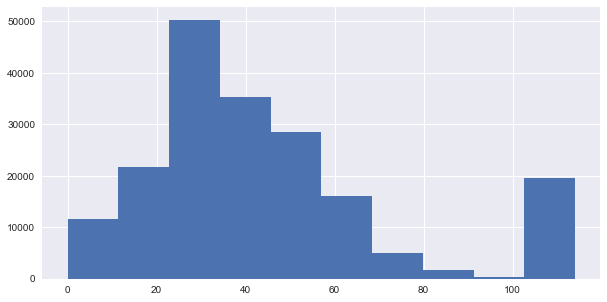

In [110]:
%matplotlib inline
histograms = df2014['Victim Age'].hist(figsize=(10,5))

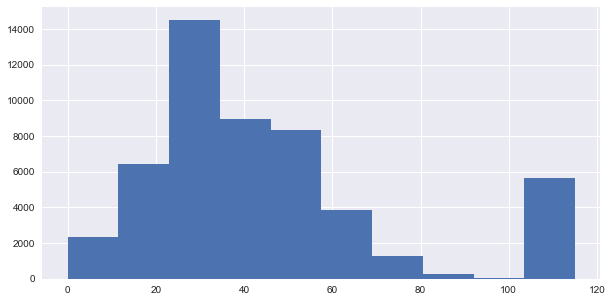

In [111]:
%matplotlib inline
histograms = df2015['Victim Age'].hist(figsize=(10,5))

**The histograms shows better results for victims age: in 2014 and in 2015 we have a lot of victims between age 20 and 60 but in 2014 the number of victims around the 40s are less than in 2015.**

In [112]:
df2014['Victim Age'].describe()

count    190330.000000
mean         44.395271
std          28.813312
min           0.000000
25%          26.000000
50%          38.000000
75%          54.000000
max         114.000000
Name: Victim Age, dtype: float64

In [113]:
df2015['Victim Age'].describe()

count    51678.00000
mean        44.94189
std         29.12645
min          0.00000
25%         25.00000
50%         37.00000
75%         54.00000
max        115.00000
Name: Victim Age, dtype: float64

**In the next cells we calculate the percentage of victims based on their ethnicity.**

In [114]:
descent_dict = {'A':'Other Asian','B' : 'Black','C' : 'Chinese','D' : 'Cambodian','F' : 'Filipino',
                'G' : 'Guamanian','H' : 'Hispanic/Latin/Mexican','I' : 'American Indian/Alaskan Native', 
                'J' : 'Japanese','K' : 'Korean','L' : 'Laotian','O' : 'Other','P' : 'Pacific Islander', 
                'S' : 'Samoan','U' : 'Hawaiian' ,'V' : 'Vietnamese','W' : 'White','X' : 'Unknown','Z' : 'Asian Indian'
}

In [115]:
#codice per victim descent 2014
descents = df2014['Victim Descent'].value_counts().index.values
descents.sort()
descents

array(['A', 'B', 'C', 'D', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'O', 'P',
       'U', 'V', 'W', 'X', 'Z'], dtype=object)

In [116]:
countsDescent = df2014['Victim Descent'].value_counts()
for descent in descents:
    descNum = countsDescent[descent]
    percDesc = round((descNum/df2014Rows)*100,2)
    print("Percentage of victims with descent ",descent_dict[descent]," in 2014 are: ",percDesc,"%")

Percentage of victims with descent  Other Asian  in 2014 are:  2.43 %
Percentage of victims with descent  Black  in 2014 are:  17.09 %
Percentage of victims with descent  Chinese  in 2014 are:  0.03 %
Percentage of victims with descent  Cambodian  in 2014 are:  0.0 %
Percentage of victims with descent  Filipino  in 2014 are:  0.12 %
Percentage of victims with descent  Guamanian  in 2014 are:  0.01 %
Percentage of victims with descent  Hispanic/Latin/Mexican  in 2014 are:  35.54 %
Percentage of victims with descent  American Indian/Alaskan Native  in 2014 are:  0.04 %
Percentage of victims with descent  Japanese  in 2014 are:  0.02 %
Percentage of victims with descent  Korean  in 2014 are:  0.52 %
Percentage of victims with descent  Laotian  in 2014 are:  0.0 %
Percentage of victims with descent  Other  in 2014 are:  9.94 %
Percentage of victims with descent  Pacific Islander  in 2014 are:  0.01 %
Percentage of victims with descent  Hawaiian  in 2014 are:  0.01 %
Percentage of victims w

**In 2014 the highest number of victims are *Hispanic*/*Latin*/*Mexican* than we have a lot of *White* and *Black* victims.**

In [117]:
#codice per victim descent 2015

In [118]:
descents = df2015['Victim Descent'].value_counts().index.values
descents.sort()
descents

array(['A', 'B', 'C', 'F', 'G', 'H', 'I', 'J', 'K', 'O', 'P', 'S', 'U',
       'V', 'W', 'X', 'Z'], dtype=object)

In [119]:
countsDescent = df2015['Victim Descent'].value_counts()
for descent in descents:
    descNum = countsDescent[descent]
    percDesc = round((descNum/df2015Rows)*100,2)
    print("Percentage of victims with descent ",descent_dict[descent]," in 2015 are: ",percDesc,"%")

Percentage of victims with descent  Other Asian  in 2015 are:  2.7 %
Percentage of victims with descent  Black  in 2015 are:  20.11 %
Percentage of victims with descent  Chinese  in 2015 are:  0.06 %
Percentage of victims with descent  Filipino  in 2015 are:  0.08 %
Percentage of victims with descent  Guamanian  in 2015 are:  0.01 %
Percentage of victims with descent  Hispanic/Latin/Mexican  in 2015 are:  41.41 %
Percentage of victims with descent  American Indian/Alaskan Native  in 2015 are:  0.12 %
Percentage of victims with descent  Japanese  in 2015 are:  0.02 %
Percentage of victims with descent  Korean  in 2015 are:  0.2 %
Percentage of victims with descent  Other  in 2015 are:  8.1 %
Percentage of victims with descent  Pacific Islander  in 2015 are:  0.02 %
Percentage of victims with descent  Samoan  in 2015 are:  0.0 %
Percentage of victims with descent  Hawaiian  in 2015 are:  0.0 %
Percentage of victims with descent  Vietnamese  in 2015 are:  0.0 %
Percentage of victims with 

**In 2015 the results are the same as in 2014 but we have an increase of *Hispanic*/*Latin*/*Mexican* victims, less *Black* victims and less *White* victims.**

**In these new cells we calulate the pie charts in order to represent in a better way the ethnicity of the victims in 2014 and in 2015**.

In [120]:
count_descent = df2014['Victim Descent'].value_counts().to_frame()
count_descent

,Victim Descent
H,67640
W,47051
B,32526
O,18911
X,18138
A,4625
K,993
F,222
I,72
C,52


In [121]:
count_descent.rename(columns={'Victim Descent': 'Descent Count'}, inplace=True)
count_descent

,Descent Count
H,67640
W,47051
B,32526
O,18911
X,18138
A,4625
K,993
F,222
I,72
C,52


In [122]:
toframe_descent = pd.DataFrame.from_dict(descent_dict, orient='index' )
toframe_descent

,0
A,Other Asian
B,Black
C,Chinese
D,Cambodian
F,Filipino
G,Guamanian
H,Hispanic/Latin/Mexican
I,American Indian/Alaskan Native
J,Japanese
K,Korean


In [123]:
#change the name to the column
toframe_descent.rename(columns={0: 'Descent Name'}, inplace=True)
toframe_descent

,Descent Name
A,Other Asian
B,Black
C,Chinese
D,Cambodian
F,Filipino
G,Guamanian
H,Hispanic/Latin/Mexican
I,American Indian/Alaskan Native
J,Japanese
K,Korean


In [124]:
count_descent['Descent Name'] = toframe_descent['Descent Name']
count_descent

,Descent Count,Descent Name
H,67640,Hispanic/Latin/Mexican
W,47051,White
B,32526,Black
O,18911,Other
X,18138,Unknown
A,4625,Other Asian
K,993,Korean
F,222,Filipino
I,72,American Indian/Alaskan Native
C,52,Chinese


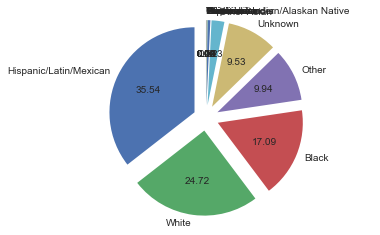

In [125]:
# Create a pie chart
plt.pie(
    # using data total)arrests
    count_descent['Descent Count'],
    # with the labels being officer names
    labels=count_descent['Descent Name'],   
    explode = (1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5),
    # with no shadows
    shadow=False,     
    # with the start angle at 90%
    startangle=90,
    radius = 10.0,
    # with the percent listed as a fraction
    autopct= '%.2f'
    )

# View the plot drop above
plt.axis('equal')
# View the plot
plt.show()

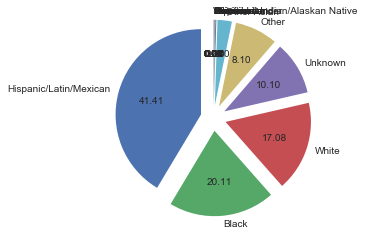

In [126]:
count_descent = df2015['Victim Descent'].value_counts().to_frame()
count_descent.rename(columns={'Victim Descent': 'Descent Count'}, inplace=True)
toframe_descent = pd.DataFrame.from_dict(descent_dict, orient='index' )
toframe_descent.rename(columns={0: 'Descent Name'}, inplace=True)
count_descent['Descent Name'] = toframe_descent['Descent Name']

# Create a pie chart
plt.pie(
    # using data total)arrests
    count_descent['Descent Count'],
    # with the labels being officer names
    labels=count_descent['Descent Name'],   
    explode = (1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5),
    # with no shadows
    shadow=False,     
    # with the start angle at 90%
    startangle=90,
    radius = 10.0,
    # with the percent listed as a fraction
    autopct= '%.2f'
    )

# View the plot drop above
plt.axis('equal')
# View the plot
plt.show()

**In this next cells we show on a map the *LAPD* (Los Angeles Police Department) *reporting districts* by highlighting by colors the district which had the highest crime reports.**

**NB. these new maps shows the number of reports per LAPD district and not the number of crimes per district.**

In [127]:
lapd_districts = os.path.join('data','lapd-reporting-districts.geojson')

LAPDdistricts = json.load(open(lapd_districts))
LAPDdistricts

{'features': [{'geometry': {'coordinates': [[[[-118.55356532919834,
        34.22047649955205],
       [-118.54608331264583, 34.22058931096582],
       [-118.54589534166546, 34.21818258936903],
       [-118.54537885562353, 34.217441118291816],
       [-118.54419876850895, 34.21627760375193],
       [-118.54400298908644, 34.215676360430336],
       [-118.54397584897835, 34.20839065053611],
       [-118.56226807722508, 34.208356199720775],
       [-118.56228100897515, 34.22034700582404],
       [-118.55356532919834, 34.22047649955205]]]],
    'type': 'MultiPolygon'},
   'properties': {'external_id': '1001',
    'kind': 'LAPD Reporting District',
    'metadata': {'number': '1001'},
    'name': '1001',
    'resource_uri': '/1.0/boundary/1001-lapd-reporting-district/',
    'set': '/1.0/boundary-set/lapd-reporting-districts/',
    'slug': '1001-lapd-reporting-district'},
   'type': 'Feature'},
  {'geometry': {'coordinates': [[[[-118.54608331264583, 34.22058931096582],
       [-118.5360792820

In [128]:
kw = {'location': [34.052235, -118.243683], 'zoom_start': 10}

m = folium.Map(**kw)

folium.GeoJson(LAPDdistricts).add_to(m)

m


In [129]:
df_distr = pd.DataFrame(LAPDdistricts['features'])
df_distr

,geometry,properties,type
0,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
1,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
2,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
3,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
4,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
5,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
6,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
7,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
8,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature
9,"{'type': 'MultiPolygon', 'coordinates': [[[[-1...","{'kind': 'LAPD Reporting District', 'external_...",Feature


In [130]:
dist_codes = {}
dist_codes = {int(df_distr['properties'][i]['name']):0 for i in range(0, len(df_distr.index))}

dist_codes

{1001: 0,
 1003: 0,
 1004: 0,
 1005: 0,
 1006: 0,
 1007: 0,
 1008: 0,
 1009: 0,
 1011: 0,
 1012: 0,
 1015: 0,
 1017: 0,
 1018: 0,
 1019: 0,
 101: 0,
 1021: 0,
 1023: 0,
 1024: 0,
 1025: 0,
 1027: 0,
 1028: 0,
 1029: 0,
 1031: 0,
 1033: 0,
 1034: 0,
 1035: 0,
 1037: 0,
 1039: 0,
 1041: 0,
 1043: 0,
 1044: 0,
 1045: 0,
 1047: 0,
 1049: 0,
 105: 0,
 1061: 0,
 1063: 0,
 1065: 0,
 1067: 0,
 1068: 0,
 1075: 0,
 1077: 0,
 1078: 0,
 1079: 0,
 1083: 0,
 1088: 0,
 1089: 0,
 1091: 0,
 1094: 0,
 1097: 0,
 1098: 0,
 1099: 0,
 109: 0,
 1101: 0,
 1102: 0,
 1105: 0,
 1107: 0,
 1109: 0,
 1112: 0,
 1113: 0,
 1115: 0,
 1116: 0,
 1117: 0,
 1118: 0,
 1119: 0,
 111: 0,
 1122: 0,
 1123: 0,
 1124: 0,
 1125: 0,
 1126: 0,
 1127: 0,
 1128: 0,
 1129: 0,
 112: 0,
 1132: 0,
 1133: 0,
 1134: 0,
 1135: 0,
 1136: 0,
 1137: 0,
 1138: 0,
 1139: 0,
 1141: 0,
 1142: 0,
 1143: 0,
 1144: 0,
 1145: 0,
 1146: 0,
 1147: 0,
 1148: 0,
 1149: 0,
 1151: 0,
 1152: 0,
 1153: 0,
 1157: 0,
 1158: 0,
 1159: 0,
 1161: 0,
 1162: 0,
 1163

In [131]:
disctCrimes2014 = df2014['Reporting District'].value_counts()
disctCrimes2014 = disctCrimes2014.to_frame()
disctCrimes2014

,Reporting District
363,1228
645,811
636,777
2156,756
1239,754
1801,720
646,709
1985,705
1494,674
1822,638


In [132]:
colormap = linear.Paired.scale(
    disctCrimes2014.loc[:,'Reporting District'].min(),
    disctCrimes2014.loc[:,'Reporting District'].max())


colormap

In [133]:
for i in disctCrimes2014.index:
    dist_codes[i] = disctCrimes2014.loc[i]['Reporting District']
    
dist_codes

{1001: 291,
 1003: 204,
 1004: 190,
 1005: 160,
 1006: 101,
 1007: 99,
 1008: 349,
 1009: 10,
 1011: 302,
 1012: 123,
 1015: 250,
 1017: 216,
 1018: 247,
 1019: 51,
 101: 144,
 1021: 139,
 1023: 228,
 1024: 133,
 1025: 309,
 1027: 126,
 1028: 198,
 1029: 216,
 1031: 121,
 1033: 227,
 1034: 127,
 1035: 216,
 1037: 128,
 1039: 247,
 1041: 101,
 1043: 191,
 1044: 126,
 1045: 196,
 1047: 195,
 1049: 90,
 105: 37,
 1061: 137,
 1063: 388,
 1065: 184,
 1067: 146,
 1068: 20,
 1075: 125,
 1077: 66,
 1078: 127,
 1079: 143,
 1083: 78,
 1088: 88,
 1089: 59,
 1091: 83,
 1094: 60,
 1097: 101,
 1098: 9,
 1099: 72,
 109: 2,
 1101: 204,
 1102: 238,
 1105: 58,
 1107: 214,
 1109: 139,
 1112: 118,
 1113: 222,
 1115: 181,
 1116: 116,
 1117: 169,
 1118: 154,
 1119: 130,
 111: 470,
 1122: 17,
 1123: 108,
 1124: 274,
 1125: 148,
 1126: 145,
 1127: 145,
 1128: 122,
 1129: 161,
 112: 15,
 1132: 240,
 1133: 177,
 1134: 199,
 1135: 153,
 1136: 297,
 1137: 126,
 1138: 153,
 1139: 172,
 1141: 213,
 1142: 288,
 1143

In [134]:
kw = {'location': [34.052235, -118.243683], 'zoom_start': 10}
m = folium.Map(**kw, tiles='cartodBpositron')

folium.GeoJson(open(lapd_districts),
       style_function=lambda features: { 
        'fillColor': colormap(dist_codes[int(features['properties']['name'])]),
        'color': 'black',
        'weight': 1,
        'dashArray': '2, 2'
    }).add_to(m)

colormap.add_to(m)
m

**In order to show better the differences in the number of crime reports in each LAPD dicstrict we need to normalize the data by using the *logarthmic function*.**

In [135]:
disctCrimes2014['Reporting District'] = np.log(disctCrimes2014['Reporting District'])

dist_codes = {}
dist_codes = {int(df_distr['properties'][i]['name']):0 for i in range(0, len(df_distr.index))}

for i in disctCrimes2014.index:
    dist_codes[i] = disctCrimes2014.loc[i]['Reporting District']

colormap = linear.Paired.scale(
    disctCrimes2014.loc[:,'Reporting District'].min(),
    disctCrimes2014.loc[:,'Reporting District'].max())

kw = {'location': [34.052235, -118.243683], 'zoom_start': 10}
m = folium.Map(**kw, tiles='cartodBpositron')

folium.GeoJson(open(lapd_districts),
       style_function=lambda features: { 
        'fillColor': colormap(dist_codes[int(features['properties']['name'])]),
        'color': 'black',
        'weight': 1,
        'dashArray': '2, 2'
    }).add_to(m)

colormap.add_to(m)
m

We can see from the maps that in 2014 **the number of crime reports are well distributed all over the entire city**, so, if wee see the maps that show where crimes happened, **there isn't any correlation between where a crime happened and where the crime is reported**. **In matter of fact in the first map all the crimes are concentrated in the center of Los Angeles and in here all the reports all well distributed all over the city**.

In [136]:
disctCrimes2015 = df2015['Reporting District'].value_counts()
disctCrimes2015 = disctCrimes2015.to_frame()

dist_codes = {}
dist_codes = {int(df_distr['properties'][i]['name']):0 for i in range(0, len(df_distr.index))}

for i in disctCrimes2015.index:
    dist_codes[i] = disctCrimes2015.loc[i]['Reporting District']

colormap = linear.Paired.scale(
    disctCrimes2015.loc[:,'Reporting District'].min(),
    disctCrimes2015.loc[:,'Reporting District'].max())

kw = {'location': [34.052235, -118.243683], 'zoom_start': 10}
m = folium.Map(**kw, tiles='cartodBpositron')

folium.GeoJson(open(lapd_districts),
       style_function=lambda features: { 
        'fillColor': colormap(dist_codes[int(features['properties']['name'])]),
        'color': 'black',
        'weight': 1,
        'dashArray': '2, 2'
    }).add_to(m)

colormap.add_to(m)
m

In [137]:
disctCrimes2015['Reporting District'] = np.log(disctCrimes2015['Reporting District'])

dist_codes = {}
dist_codes = {int(df_distr['properties'][i]['name']):0 for i in range(0, len(df_distr.index))}

for i in disctCrimes2015.index:
    dist_codes[i] = disctCrimes2015.loc[i]['Reporting District']

colormap = linear.Paired.scale(
    disctCrimes2015.loc[:,'Reporting District'].min(),
    disctCrimes2015.loc[:,'Reporting District'].max())

kw = {'location': [34.052235, -118.243683], 'zoom_start': 10}
m = folium.Map(**kw, tiles='cartodBpositron')

folium.GeoJson(open(lapd_districts),
       style_function=lambda features: { 
        'fillColor': colormap(dist_codes[int(features['properties']['name'])]),
        'color': 'black',
        'weight': 1,
        'dashArray': '2, 2'
    }).add_to(m)

colormap.add_to(m)
m

**The same considerations made for crime reportings in 2014 stand also for 2015**.

In next cells **we cluster the individuals in 2014 using *K-mean* for k = 2...10**. In particular **we cluster the data obtained by cosidering geographical position of the crimes, the time and the weekday when it happended and victim descent for first**. **Then we make the clustering considering instead of victim descent the victim age and then the victim sex**. In order to run the clustering algorithm, we needed to convert all the *string* values in *numerical* values. To obtain this we exploited *dictionaries* which has as *key* the *string* that appears in the *dataframe* and as value the corresponding *integer* we want to use. We obtained the time values of the crimes in the dataframes by exploiting the *time-stamps* of when the crimes happened and applying the following formula: 
* $Time$ = $timestamp.hour + timestamp.minutes/60 + timestamp.second/3600$

In [29]:
descent_dict_2 = {'A': 1,'B' : 2,'C' : 3,'D' : 4,'F' : 5,
                'G' : 6,'H' : 7,'I' : 8, 
                'J' : 9,'K' : 10,'L' : 11,'O' : 12,'P' : 13, 
                'S' : 14,'U' : 15 ,'V' : 16,'W' : 17,'X' : 18,'Z' : 19}

In [139]:
df2_2014 = pd.DataFrame(index=df2014.index)
df2_2014['Lat'] = df2014['Lat']
df2_2014['Lon'] = df2014['Lon']
df2_2014['Lat'] = pd.to_numeric(df2_2014['Lat'])
df2_2014['Lon'] = pd.to_numeric(df2_2014['Lon'])
df2_2014['Date-Time Occured'] = df2014['Date-Time Occured']
df2_2014['Time'] = df2014['Date-Time Occured'].dt.hour + (df2014['Date-Time Occured'].dt.minute/60) + (df2014['Date-Time Occured'].dt.second/3600)
df2_2014['Weekday'] = df2_2014['Date-Time Occured'].dt.dayofweek
df2_2014['Victim Descent'] = df2014['Victim Descent']
del df2_2014['Date-Time Occured']
df2_2014

,Lat,Lon,Time,Weekday,Victim Descent
771150,34.0360,-118.2865,5.000000,5,X
771695,34.0523,-118.2174,22.000000,6,X
789627,34.0423,-118.2452,4.500000,6,B
790103,34.0459,-118.2657,23.500000,3,X
790223,34.0321,-118.2599,18.500000,0,H
790402,34.0454,-118.2657,22.000000,2,W
790460,34.0372,-118.2654,4.000000,4,X
790501,34.0592,-118.2411,19.000000,1,X
790780,34.0430,-118.2641,17.583333,0,W
790961,34.0433,-118.2377,7.833333,3,X


In [140]:
df2_2014 = df2_2014.replace({'Victim Descent': descent_dict_2})
df2_2014

,Lat,Lon,Time,Weekday,Victim Descent
771150,34.0360,-118.2865,5.000000,5,18
771695,34.0523,-118.2174,22.000000,6,18
789627,34.0423,-118.2452,4.500000,6,2
790103,34.0459,-118.2657,23.500000,3,18
790223,34.0321,-118.2599,18.500000,0,7
790402,34.0454,-118.2657,22.000000,2,17
790460,34.0372,-118.2654,4.000000,4,18
790501,34.0592,-118.2411,19.000000,1,18
790780,34.0430,-118.2641,17.583333,0,17
790961,34.0433,-118.2377,7.833333,3,18


In [141]:
df2_2014.dtypes

Lat               float64
Lon               float64
Time              float64
Weekday             int64
Victim Descent      int64
dtype: object

**NB. Due to problems related to the library *sklearn* we were forced to use only the 10% of the data. With more data the library it's not able calculate the silhouette scores.**

In [142]:
#in order to use clustering algorithm we had to use the 10% of the data
df2014_reduced = df2_2014.iloc[:int(len(df2_2014)/100)*10]
len(df2014_reduced)

19030

For n_clusters = 2 The average silhouette_score is : 0.349405253362


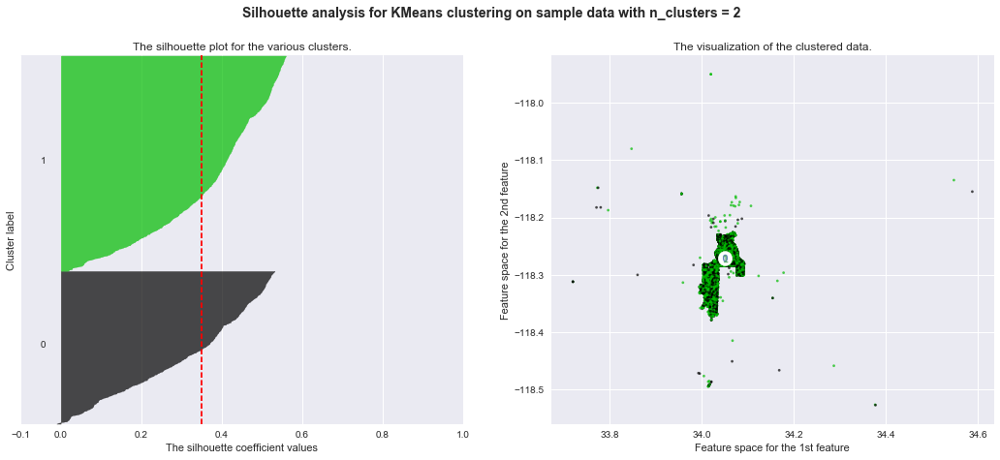

For n_clusters = 3 The average silhouette_score is : 0.397465584665


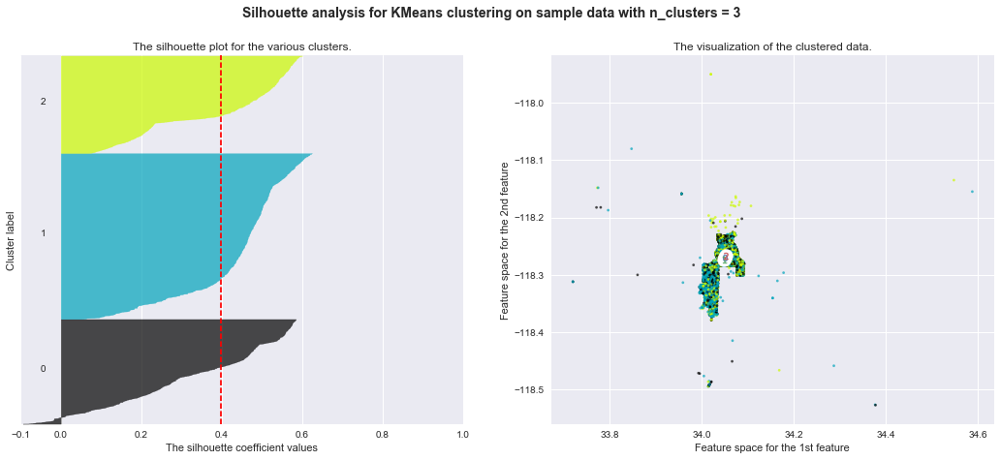

For n_clusters = 4 The average silhouette_score is : 0.389516223895


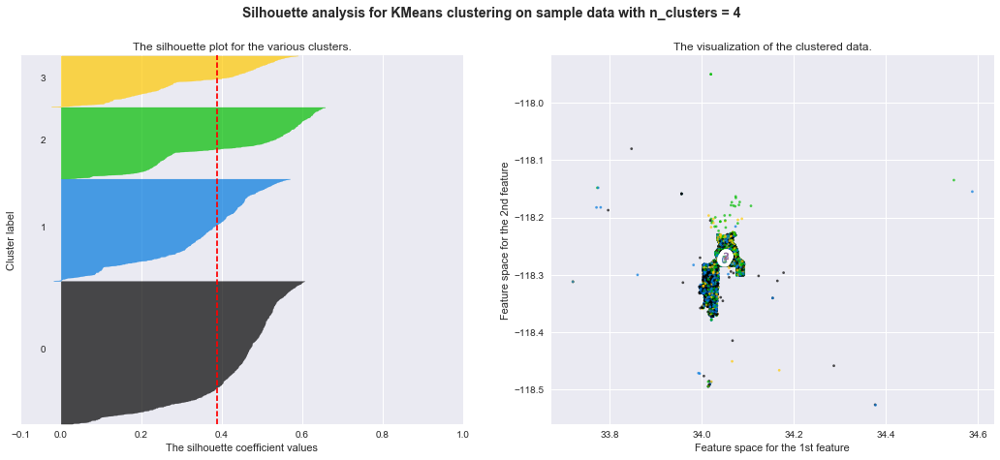

For n_clusters = 5 The average silhouette_score is : 0.375257078828


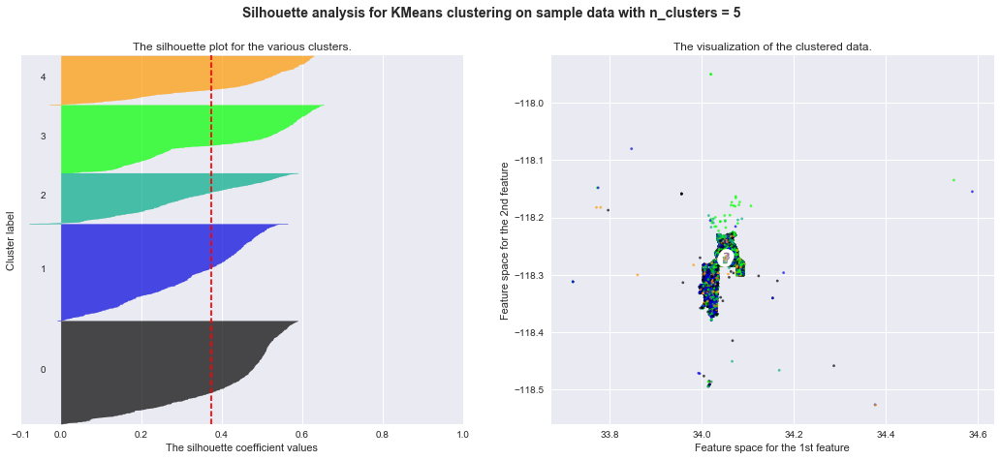

For n_clusters = 6 The average silhouette_score is : 0.37168586532


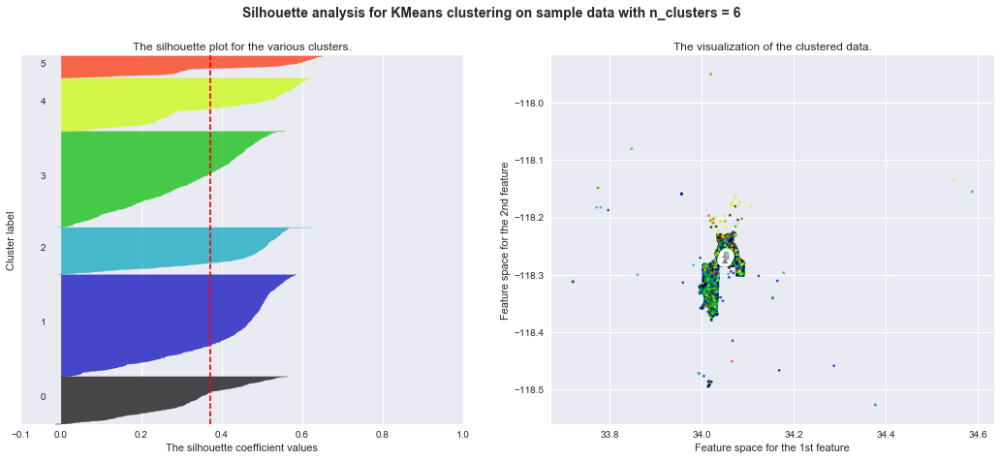

For n_clusters = 7 The average silhouette_score is : 0.356672576299


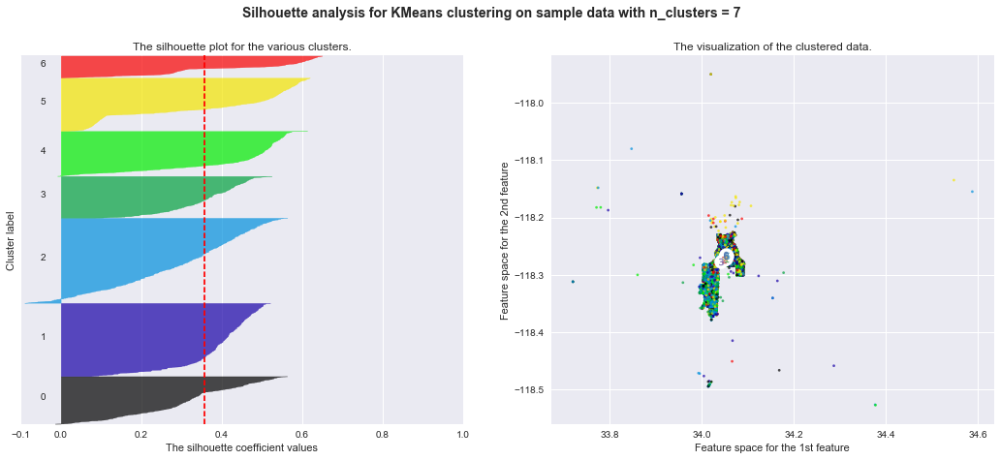

For n_clusters = 8 The average silhouette_score is : 0.36373257885


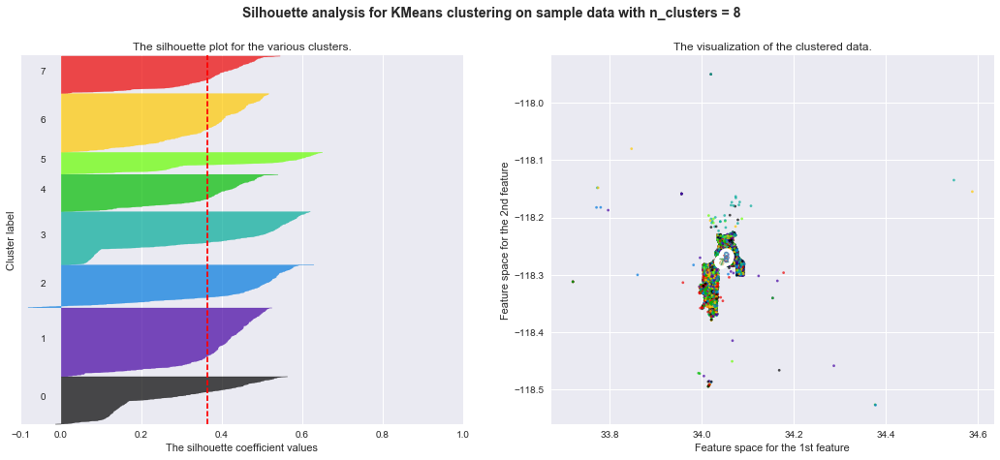

For n_clusters = 9 The average silhouette_score is : 0.370324580069


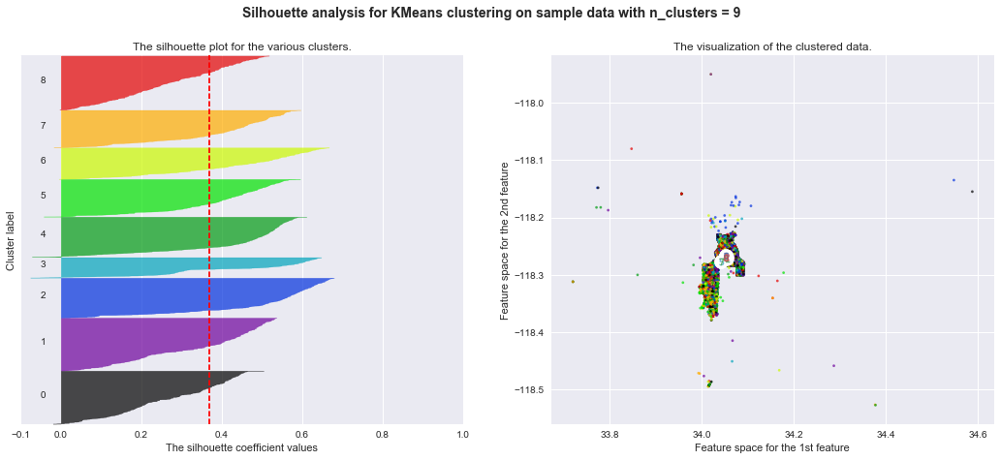

For n_clusters = 10 The average silhouette_score is : 0.375770822465


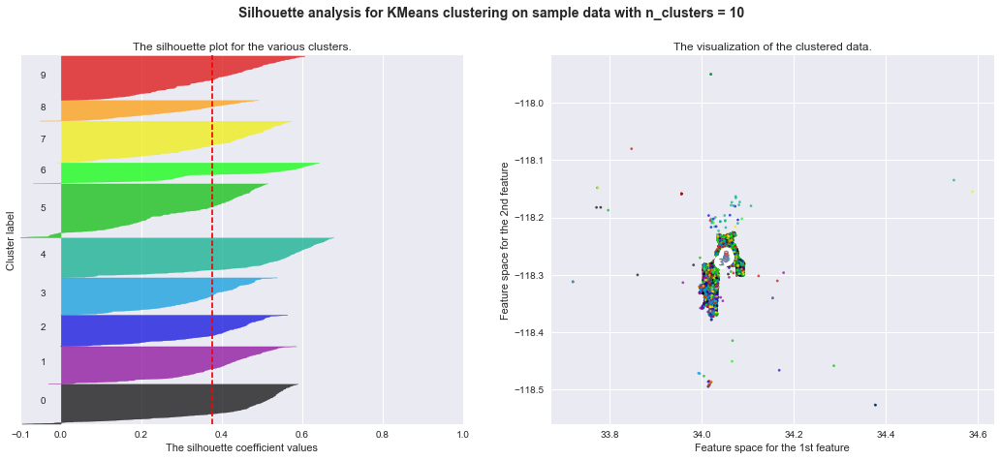

In [143]:
dfMatrix = df2014_reduced.as_matrix()
clusterScores = {}

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(dfMatrix) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(dfMatrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(dfMatrix, cluster_labels, sample_size = 1000)
    silhouette_avg = silhouette_score(dfMatrix, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    clusterScores[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfMatrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(dfMatrix[:, 0], dfMatrix[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [144]:
numIdeal = max(clusterScores, key=lambda i: clusterScores[i])
print("Il numero di cluster ideale è pari a",numIdeal,\
      "siccome ha un average silhouette score più alto di tutti e pari a",clusterScores[numIdeal])

Il numero di cluster ideale è pari a 3 siccome ha un average silhouette score più alto di tutti e pari a 0.397465584665


In [145]:
df2_2014 = pd.DataFrame(index=df2014.index)
df2_2014['Lat'] = df2014['Lat']
df2_2014['Lon'] = df2014['Lon']
df2_2014['Lat'] = pd.to_numeric(df2_2014['Lat'])
df2_2014['Lon'] = pd.to_numeric(df2_2014['Lon'])
df2_2014['Date-Time Occured'] = df2014['Date-Time Occured']
df2_2014['Time'] = df2014['Date-Time Occured'].dt.hour + (df2014['Date-Time Occured'].dt.minute/60) + (df2014['Date-Time Occured'].dt.second/3600)
df2_2014['Weekday'] = df2_2014['Date-Time Occured'].dt.dayofweek
df2_2014['Victim Age'] = df2014['Victim Age']
del df2_2014['Date-Time Occured']
df2_2014

,Lat,Lon,Time,Weekday,Victim Age
771150,34.0360,-118.2865,5.000000,5,113
771695,34.0523,-118.2174,22.000000,6,113
789627,34.0423,-118.2452,4.500000,6,49
790103,34.0459,-118.2657,23.500000,3,113
790223,34.0321,-118.2599,18.500000,0,39
790402,34.0454,-118.2657,22.000000,2,38
790460,34.0372,-118.2654,4.000000,4,113
790501,34.0592,-118.2411,19.000000,1,113
790780,34.0430,-118.2641,17.583333,0,61
790961,34.0433,-118.2377,7.833333,3,113


In [146]:
df2_2014.dtypes

Lat           float64
Lon           float64
Time          float64
Weekday         int64
Victim Age      int64
dtype: object

**NB. Due to problems related to the library *sklearn* we were forced to use only the 5% of the data. With more data the library it's not able calculate the silhouette scores.**

In [147]:
#in order to use clustering algorithm we had to use the 5% of the data
df2014_reduced = df2_2014.iloc[:int(len(df2_2014)/100)*5]
len(df2014_reduced)

9515

For n_clusters = 2 The average silhouette_score is : 0.473068380415


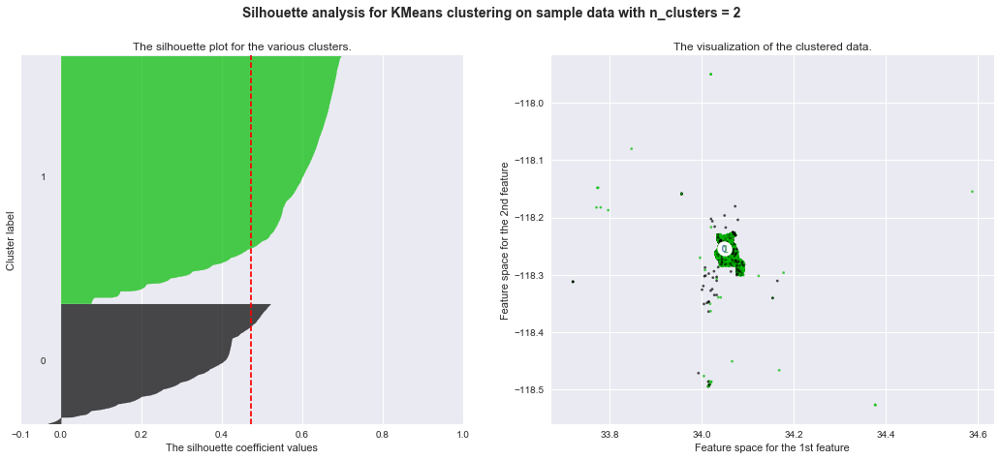

For n_clusters = 3 The average silhouette_score is : 0.483356413236


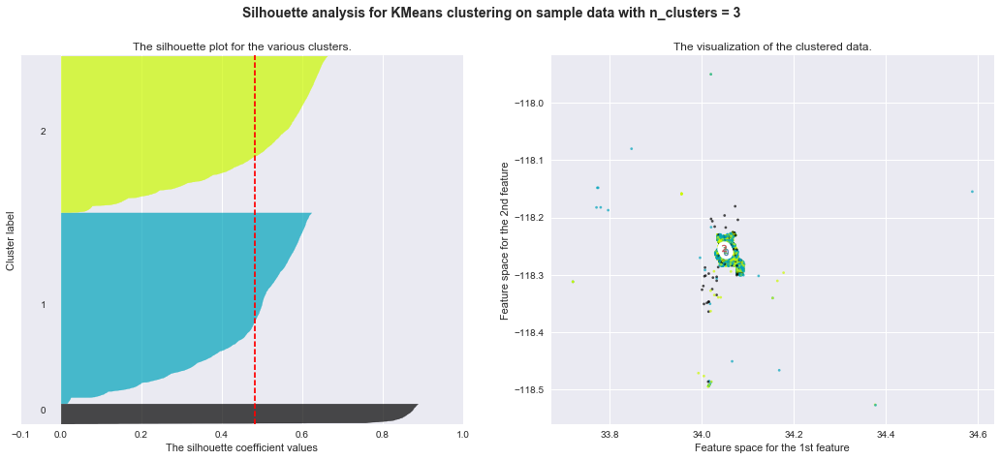

For n_clusters = 4 The average silhouette_score is : 0.469350529268


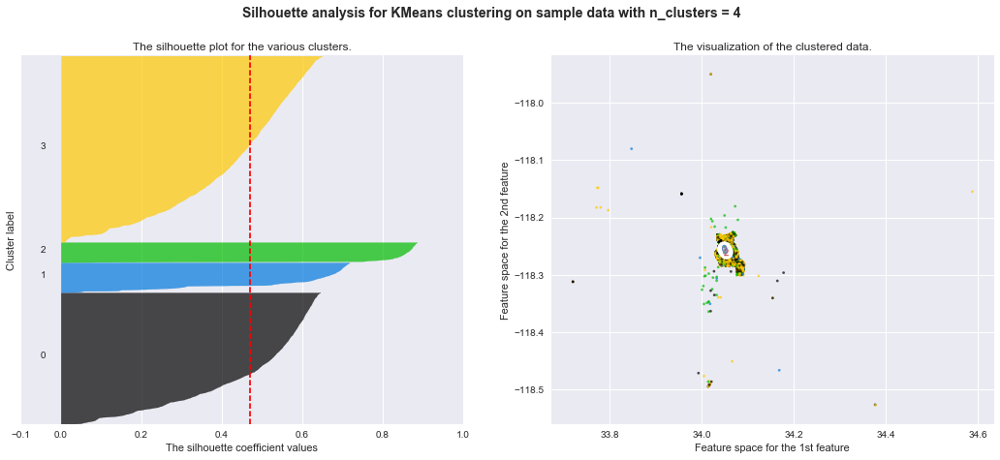

For n_clusters = 5 The average silhouette_score is : 0.391025471071


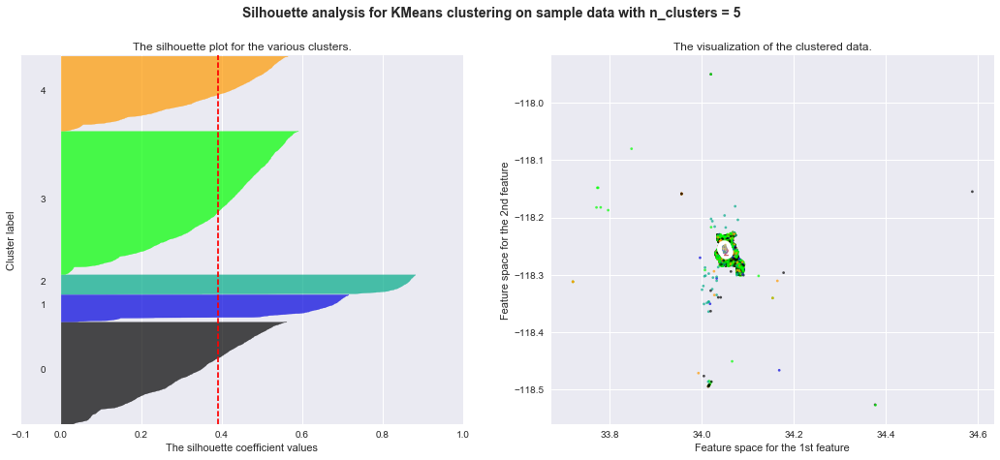

For n_clusters = 6 The average silhouette_score is : 0.385253409532


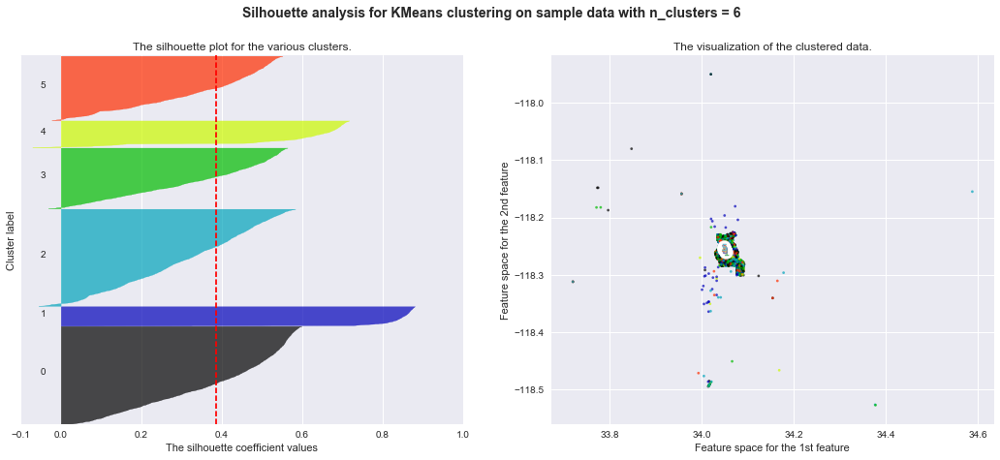

For n_clusters = 7 The average silhouette_score is : 0.378167755561


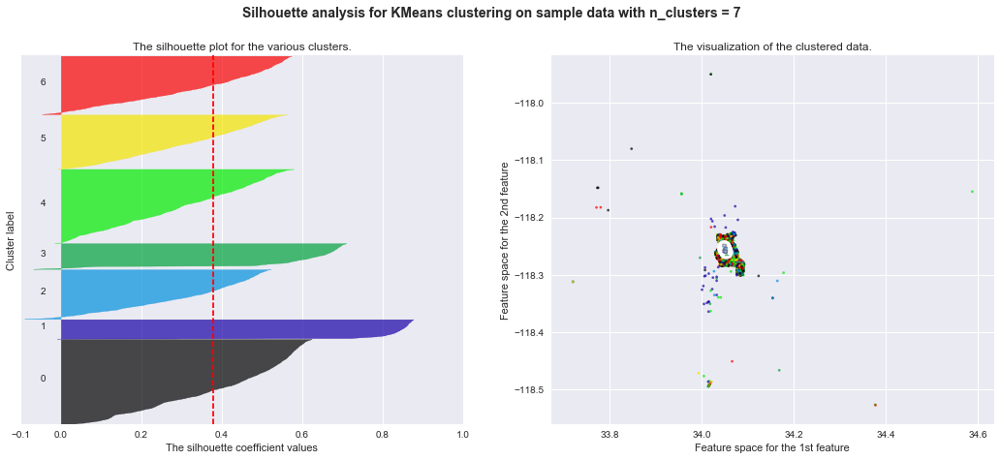

For n_clusters = 8 The average silhouette_score is : 0.37728293033


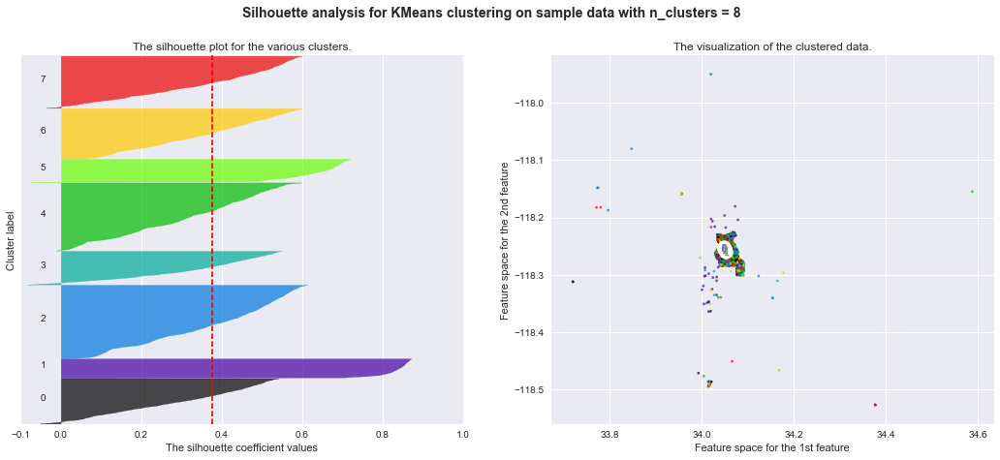

For n_clusters = 9 The average silhouette_score is : 0.363107695182


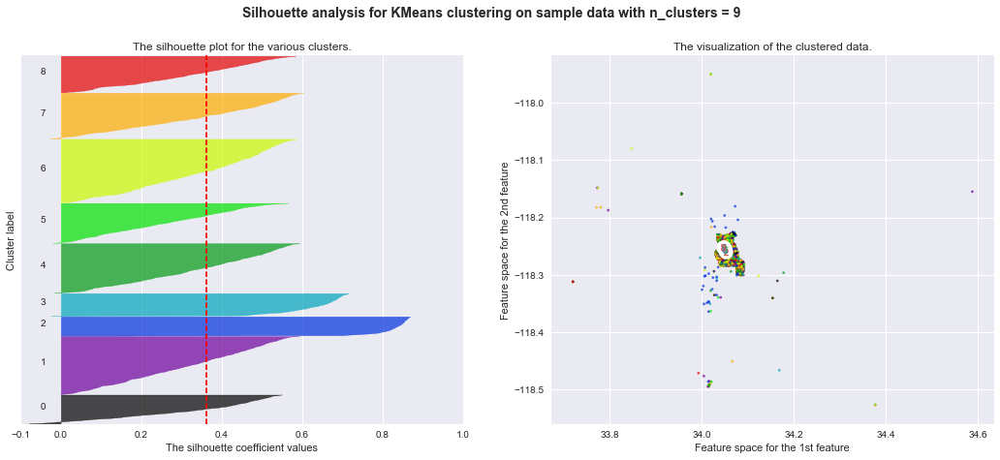

For n_clusters = 10 The average silhouette_score is : 0.350823452798


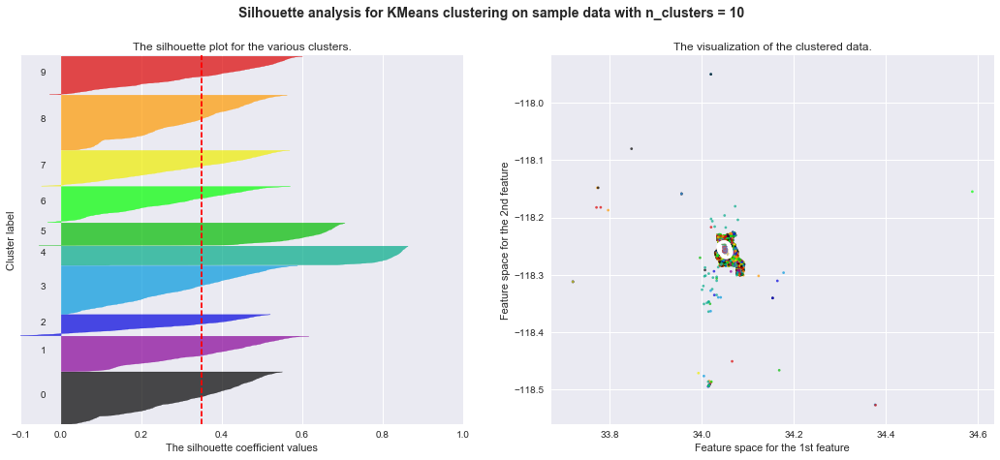

In [148]:
dfMatrix = df2014_reduced.as_matrix()
clusterScores = {}

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(dfMatrix) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(dfMatrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(dfMatrix, cluster_labels, sample_size = 1000)
    silhouette_avg = silhouette_score(dfMatrix, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    clusterScores[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfMatrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(dfMatrix[:, 0], dfMatrix[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [149]:
numIdeal = max(clusterScores, key=lambda i: clusterScores[i])
print("Il numero di cluster ideale è pari a",numIdeal,\
      "siccome ha un average silhouette score più alto di tutti e pari a",clusterScores[numIdeal])

Il numero di cluster ideale è pari a 3 siccome ha un average silhouette score più alto di tutti e pari a 0.483356413236


In [30]:
sex_dict = {'M': 1,'F' : 2,'U' : 3}

In [151]:
df2_2014 = pd.DataFrame(index=df2014.index)
df2_2014['Lat'] = df2014['Lat']
df2_2014['Lon'] = df2014['Lon']
df2_2014['Lat'] = pd.to_numeric(df2_2014['Lat'])
df2_2014['Lon'] = pd.to_numeric(df2_2014['Lon'])
df2_2014['Date-Time Occured'] = df2014['Date-Time Occured']
df2_2014['Time'] = df2014['Date-Time Occured'].dt.hour + (df2014['Date-Time Occured'].dt.minute/60) + (df2014['Date-Time Occured'].dt.second/3600)
df2_2014['Weekday'] = df2_2014['Date-Time Occured'].dt.dayofweek
df2_2014['Victim Sex'] = df2014['Victim Sex']
del df2_2014['Date-Time Occured']
df2_2014

,Lat,Lon,Time,Weekday,Victim Sex
771150,34.0360,-118.2865,5.000000,5,U
771695,34.0523,-118.2174,22.000000,6,U
789627,34.0423,-118.2452,4.500000,6,M
790103,34.0459,-118.2657,23.500000,3,U
790223,34.0321,-118.2599,18.500000,0,M
790402,34.0454,-118.2657,22.000000,2,M
790460,34.0372,-118.2654,4.000000,4,U
790501,34.0592,-118.2411,19.000000,1,U
790780,34.0430,-118.2641,17.583333,0,M
790961,34.0433,-118.2377,7.833333,3,U


In [152]:
df2_2014 = df2_2014.replace({'Victim Sex': sex_dict})
df2_2014

,Lat,Lon,Time,Weekday,Victim Sex
771150,34.0360,-118.2865,5.000000,5,3
771695,34.0523,-118.2174,22.000000,6,3
789627,34.0423,-118.2452,4.500000,6,1
790103,34.0459,-118.2657,23.500000,3,3
790223,34.0321,-118.2599,18.500000,0,1
790402,34.0454,-118.2657,22.000000,2,1
790460,34.0372,-118.2654,4.000000,4,3
790501,34.0592,-118.2411,19.000000,1,3
790780,34.0430,-118.2641,17.583333,0,1
790961,34.0433,-118.2377,7.833333,3,3


In [153]:
df2_2014.dtypes

Lat           float64
Lon           float64
Time          float64
Weekday         int64
Victim Sex      int64
dtype: object

**NB. Due to problems related to the library *sklearn* we were forced to use only the 10% of the data. With more data the library it's not able calculate the silhouette scores.**

In [154]:
#in order to use clustering algorithm we had to use the 10% of the data
df2014_reduced = df2_2014.iloc[:int(len(df2_2014)/100)*10]
len(df2014_reduced)

19030

For n_clusters = 2 The average silhouette_score is : 0.515460098803


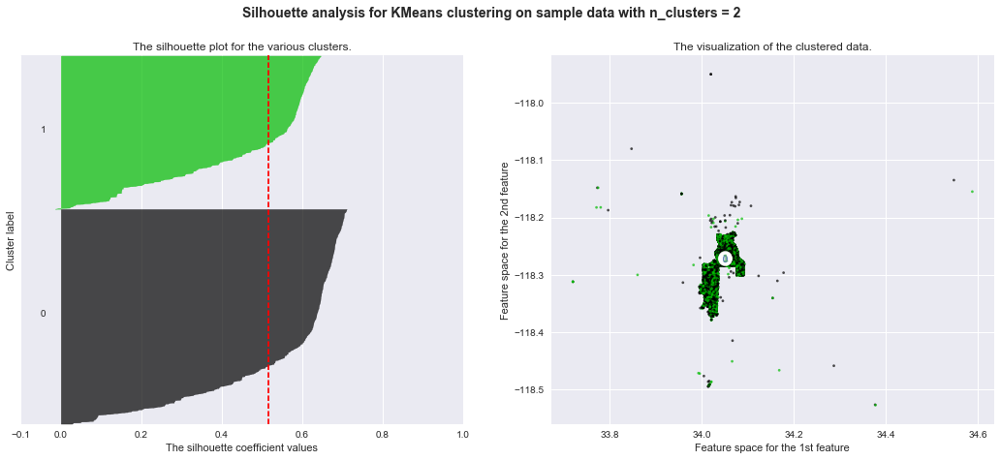

For n_clusters = 3 The average silhouette_score is : 0.471632259939


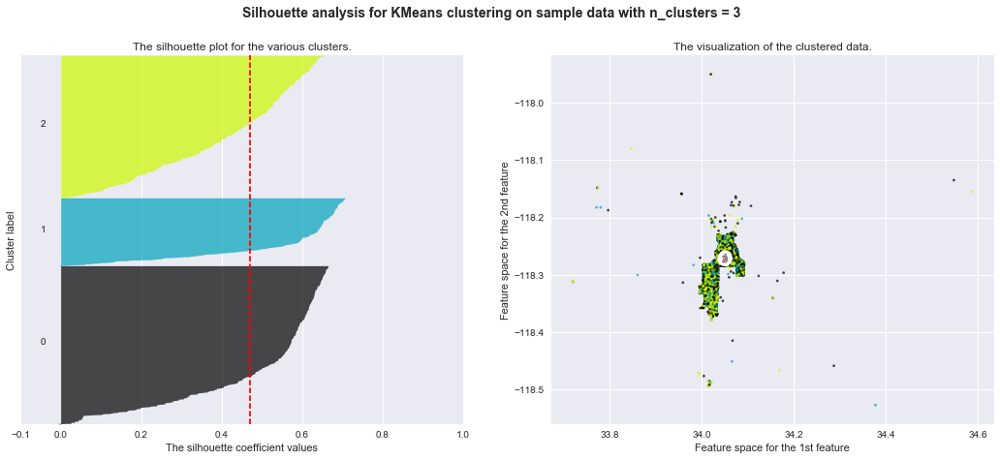

For n_clusters = 4 The average silhouette_score is : 0.397165530733


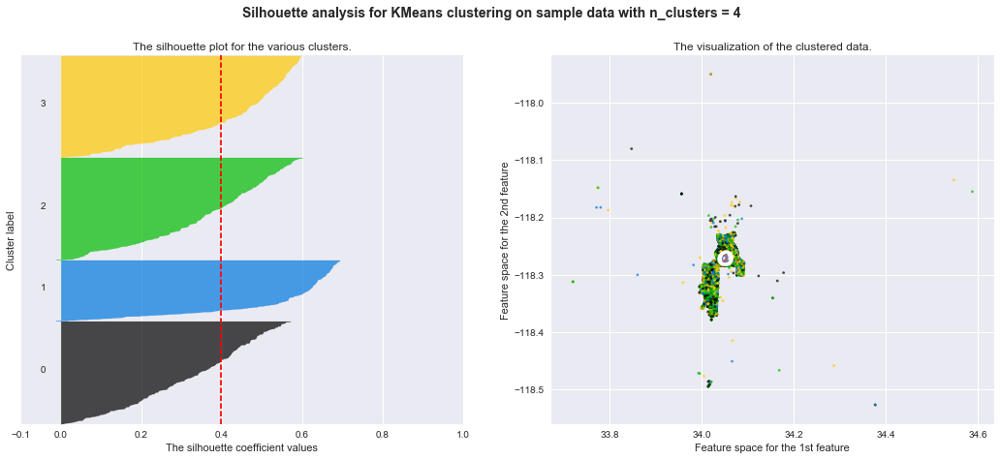

For n_clusters = 5 The average silhouette_score is : 0.347631491327


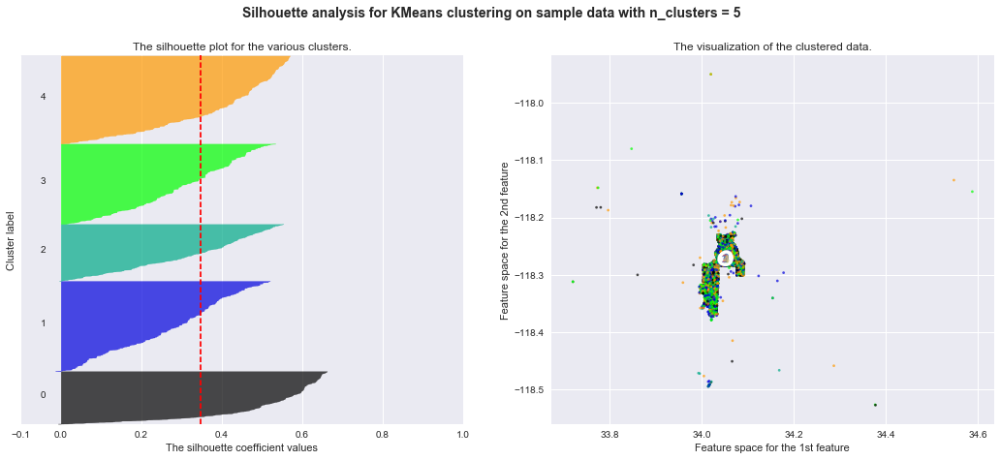

For n_clusters = 6 The average silhouette_score is : 0.35535881039


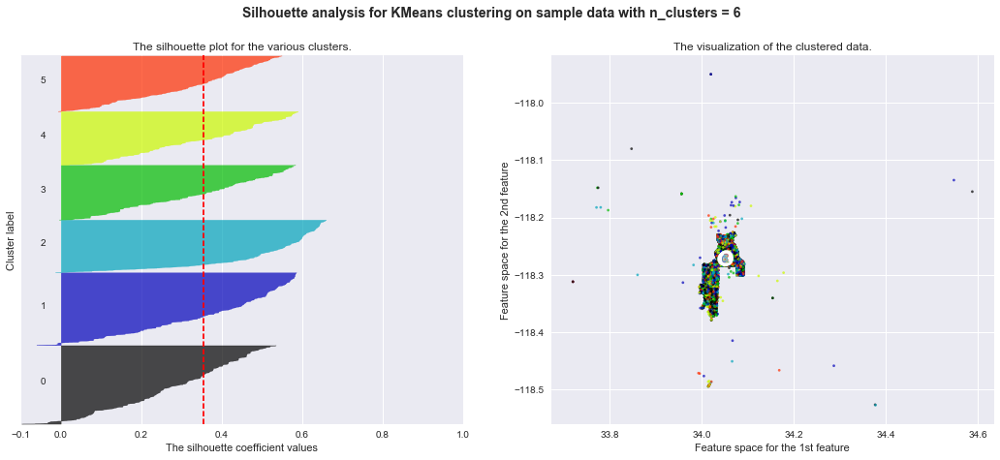

For n_clusters = 7 The average silhouette_score is : 0.368290594429


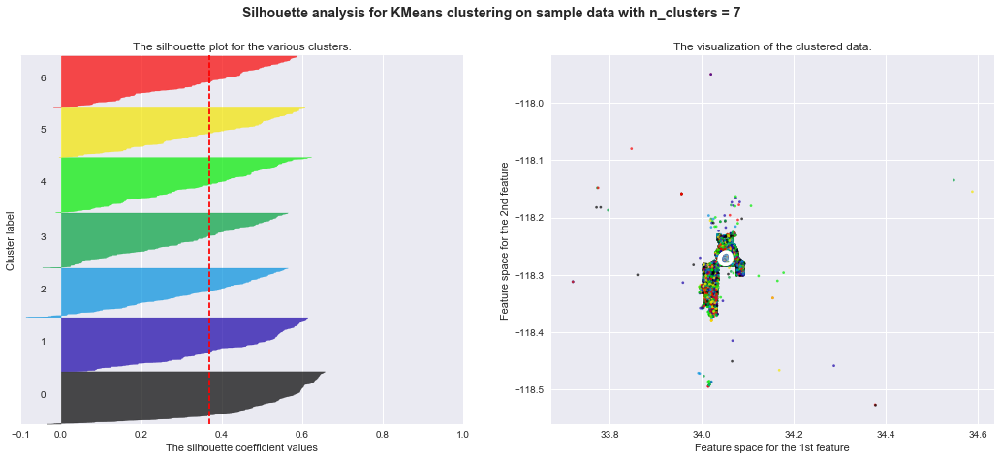

For n_clusters = 8 The average silhouette_score is : 0.363543608633


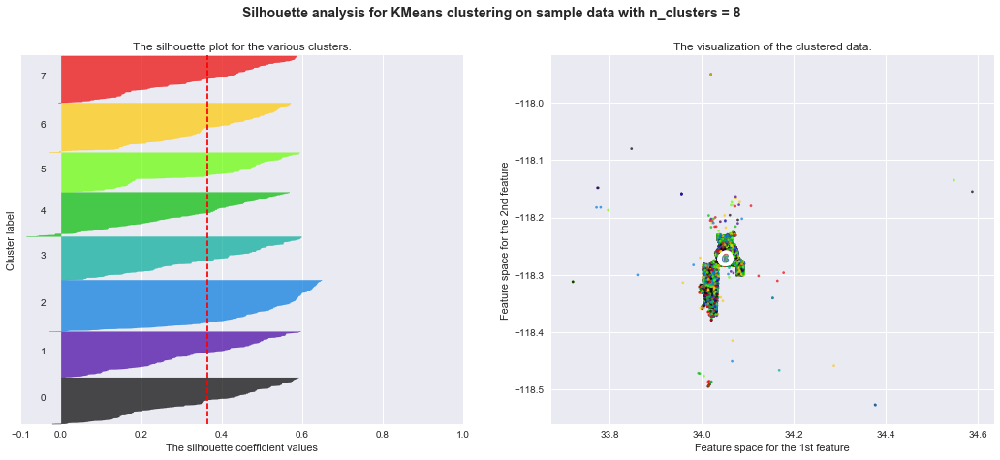

For n_clusters = 9 The average silhouette_score is : 0.353572933694


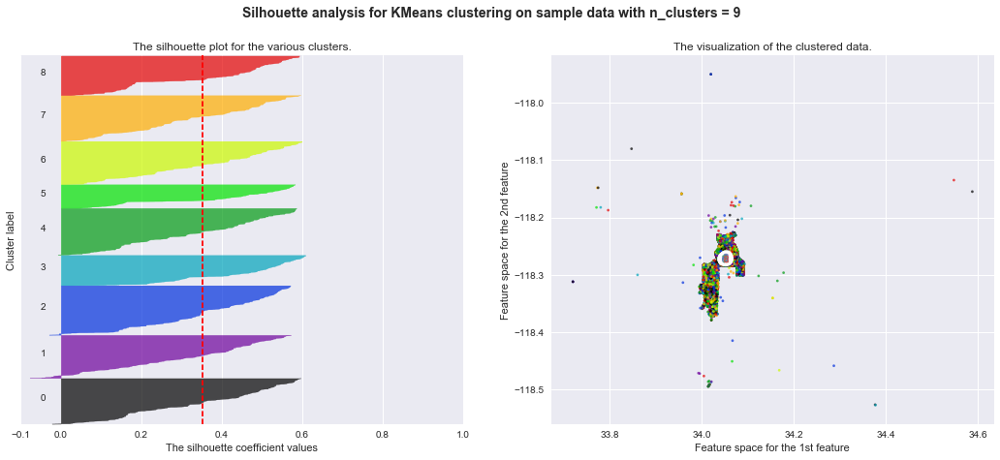

For n_clusters = 10 The average silhouette_score is : 0.353589303616


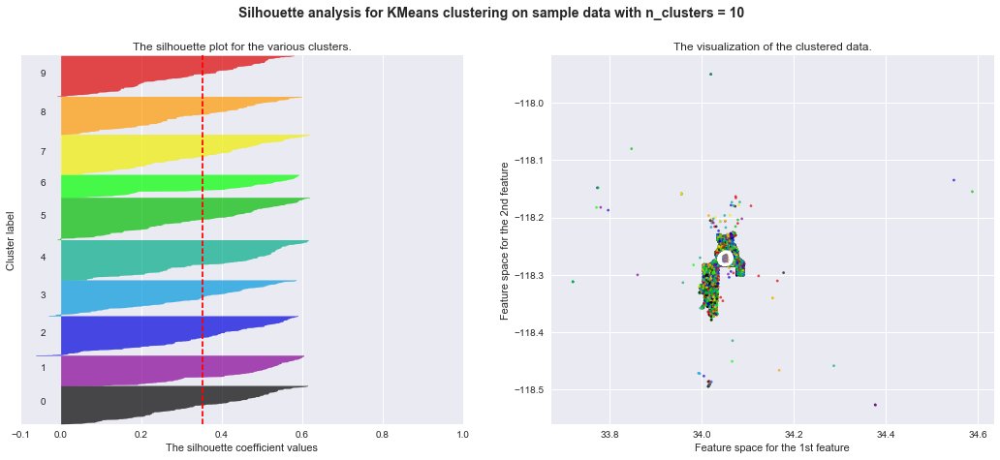

In [155]:
dfMatrix = df2014_reduced.as_matrix()
clusterScores = {}

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(dfMatrix) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(dfMatrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(dfMatrix, cluster_labels, sample_size = 1000)
    silhouette_avg = silhouette_score(dfMatrix, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    clusterScores[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfMatrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(dfMatrix[:, 0], dfMatrix[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [156]:
numIdeal = max(clusterScores, key=lambda i: clusterScores[i])
print("Il numero di cluster ideale è pari a",numIdeal,\
      "siccome ha un average silhouette score più alto di tutti e pari a",clusterScores[numIdeal])

Il numero di cluster ideale è pari a 2 siccome ha un average silhouette score più alto di tutti e pari a 0.515460098803


In next cells **we cluster the individuals in 2015 using *K-mean* for k = 2...10**. In particular **we cluster the data obtained by cosidering geographical position of the crimes, the time and the weekday when it happended and victim descent for first**. **Then we make the clustering considering instead of victim descent the victim age and then the victim sex**. In order to run the clustering algorithm, we needed to convert all the *string* values in *numerical* values. To obtain this we exploited *dictionaries* which has as *key* the *string* that appears in the *dataframe* and as value the corresponding *integer* we want to use. We obtained the time values of the crimes in the dataframes by exploiting the *time-stamps* of when the crimes happened and applying the following formula: 
* $Time$ = $timestamp.hour + timestamp.minutes/60 + timestamp.second/3600$

In [27]:
df2_2015 = pd.DataFrame(index=df2015.index)
df2_2015['Lat'] = df2015['Lat']
df2_2015['Lon'] = df2015['Lon']
df2_2015['Lat'] = pd.to_numeric(df2_2015['Lat'])
df2_2015['Lon'] = pd.to_numeric(df2_2015['Lon'])
df2_2015['Date-Time Occured'] = df2015['Date-Time Occured']
df2_2015['Time'] = df2015['Date-Time Occured'].dt.hour + (df2015['Date-Time Occured'].dt.minute/60) + (df2015['Date-Time Occured'].dt.second/3600)
df2_2015['Weekday'] = df2_2015['Date-Time Occured'].dt.dayofweek
df2_2015['Victim Descent'] = df2015['Victim Descent']
del df2_2015['Date-Time Occured']
df2_2015

,Lat,Lon,Time,Weekday,Victim Descent
931844,34.0450,-118.2628,12.000000,6,X
932023,34.0540,-118.2620,0.016667,6,X
932180,34.0858,-118.2917,15.000000,1,X
967480,34.0542,-118.2717,22.000000,3,X
967521,34.0451,-118.2779,16.500000,4,H
968162,34.0583,-118.2616,0.166667,5,X
968860,33.7808,-118.2468,4.750000,3,X
969061,34.1034,-118.3325,10.500000,1,X
989578,34.0478,-118.2454,17.166667,4,X
989639,34.0479,-118.2612,20.000000,3,H


In [31]:
df2_2015 = df2_2015.replace({'Victim Descent': descent_dict_2})
df2_2015

,Lat,Lon,Time,Weekday,Victim Descent
931844,34.0450,-118.2628,12.000000,6,18
932023,34.0540,-118.2620,0.016667,6,18
932180,34.0858,-118.2917,15.000000,1,18
967480,34.0542,-118.2717,22.000000,3,18
967521,34.0451,-118.2779,16.500000,4,7
968162,34.0583,-118.2616,0.166667,5,18
968860,33.7808,-118.2468,4.750000,3,18
969061,34.1034,-118.3325,10.500000,1,18
989578,34.0478,-118.2454,17.166667,4,18
989639,34.0479,-118.2612,20.000000,3,7


In [32]:
df2_2015.dtypes

Lat               float64
Lon               float64
Time              float64
Weekday             int64
Victim Descent      int64
dtype: object

**NB. Due to problems related to the library *sklearn* we were forced to use only the 35% of the data. With more data the library it's not able calculate the silhouette scores.**

In [35]:
#in order to use clustering algorithm we had to use the 35% of the data
df2015_reduced = df2_2015.iloc[:int(len(df2_2015)/100)*35]
len(df2015_reduced)

18060

For n_clusters = 2 The average silhouette_score is : 0.358545874568


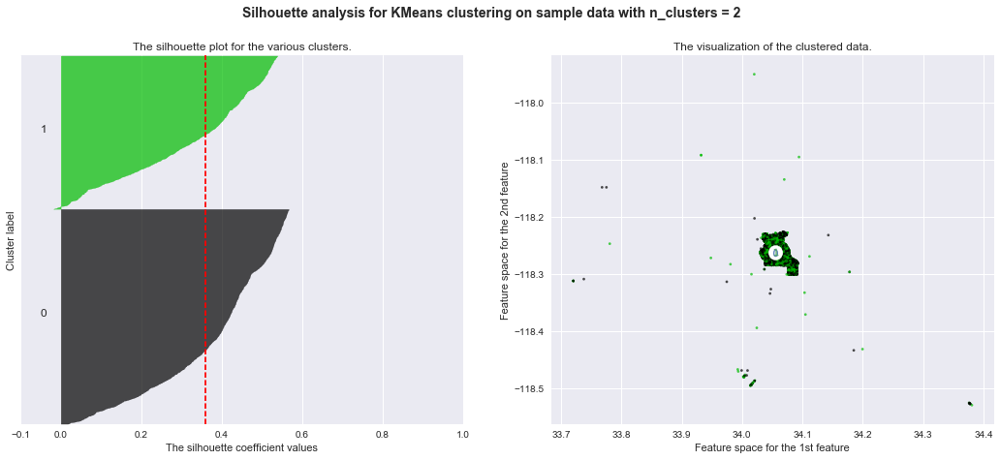

For n_clusters = 3 The average silhouette_score is : 0.402857443516


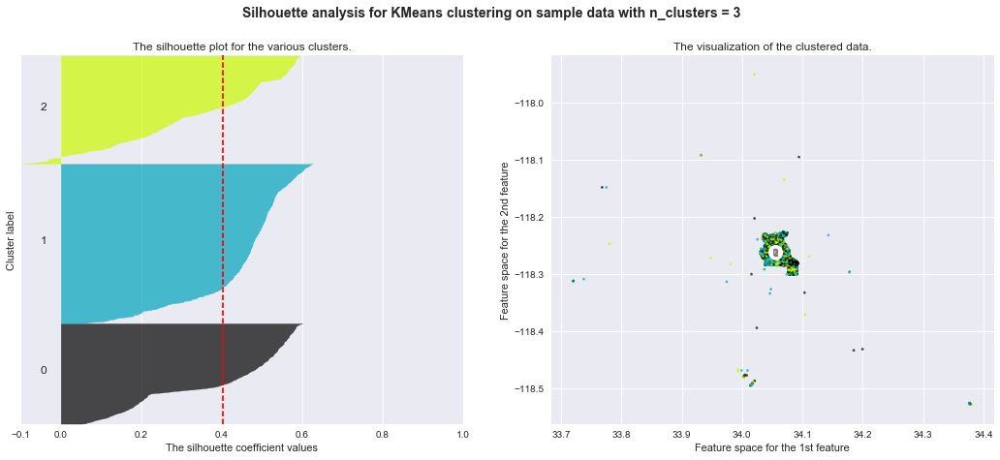

For n_clusters = 4 The average silhouette_score is : 0.39510381594


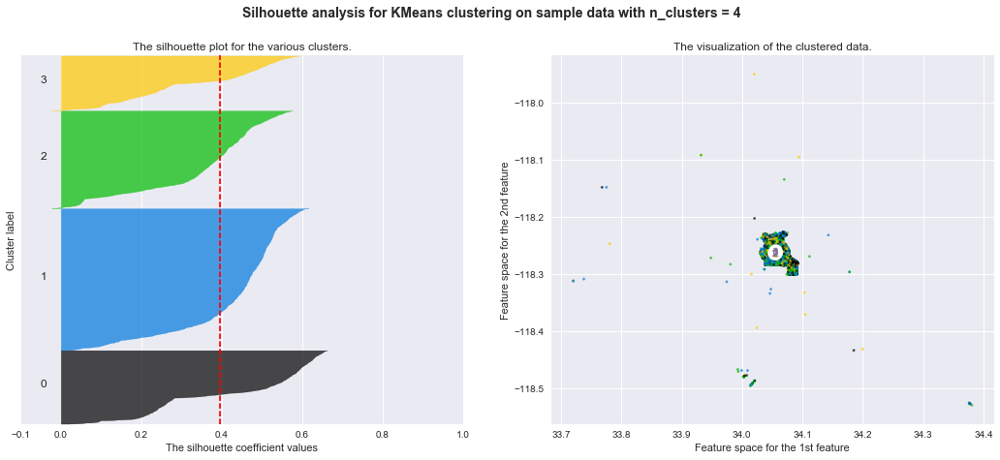

For n_clusters = 5 The average silhouette_score is : 0.380017887498


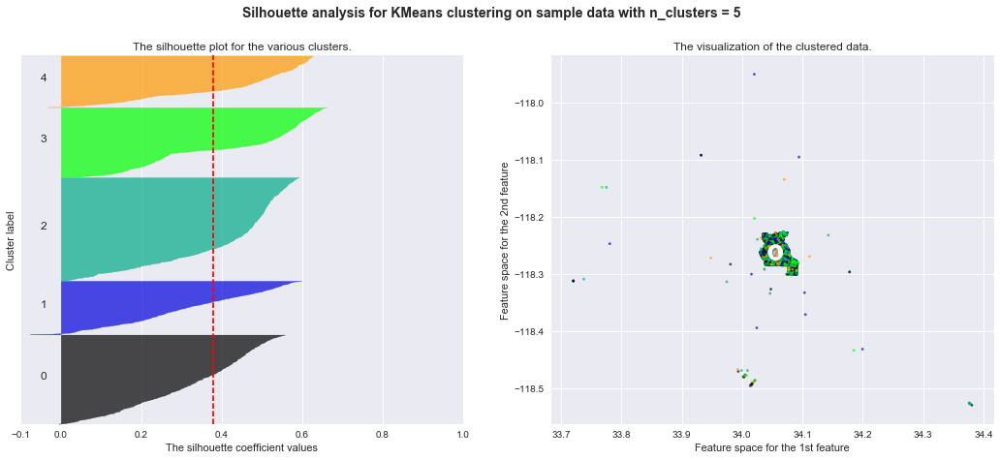

For n_clusters = 6 The average silhouette_score is : 0.373746085087


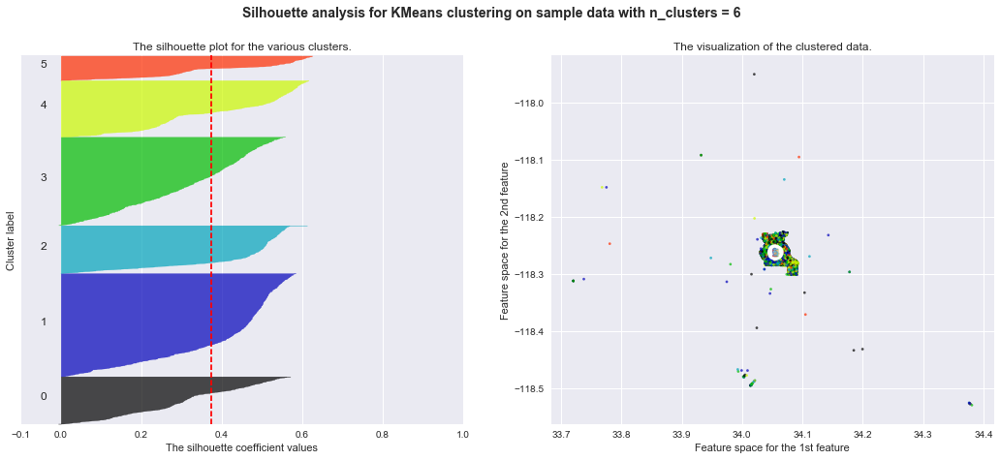

For n_clusters = 7 The average silhouette_score is : 0.360471800924


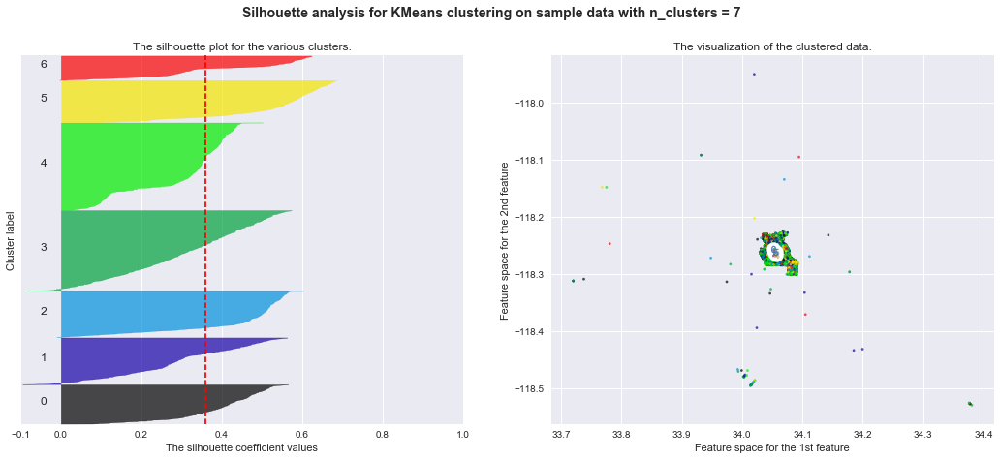

For n_clusters = 8 The average silhouette_score is : 0.351159294568


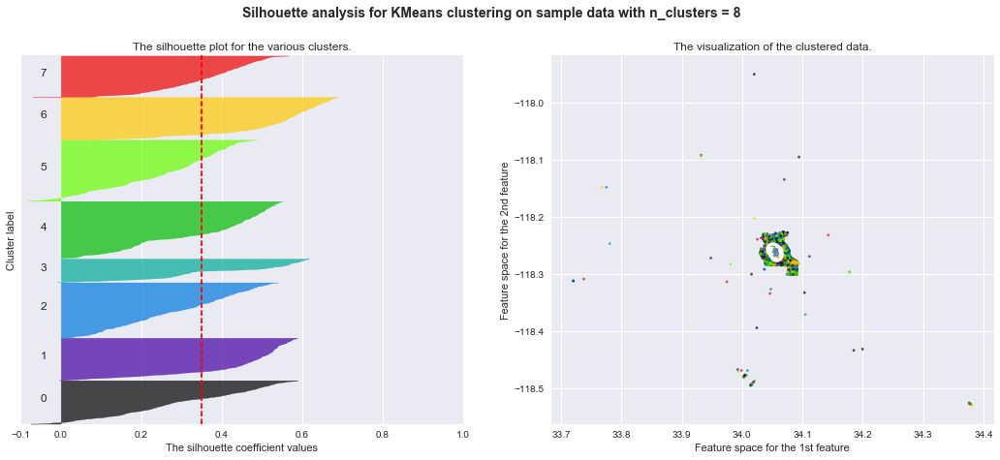

For n_clusters = 9 The average silhouette_score is : 0.370078339262


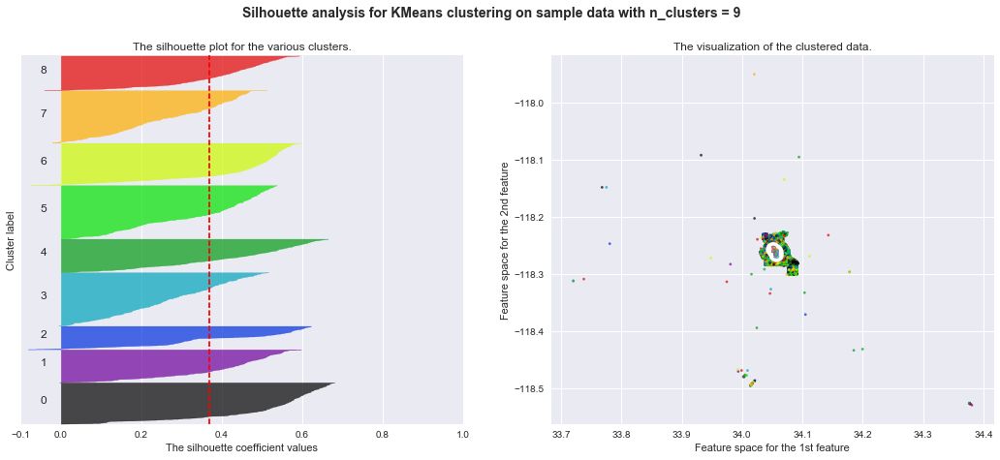

For n_clusters = 10 The average silhouette_score is : 0.372892812811


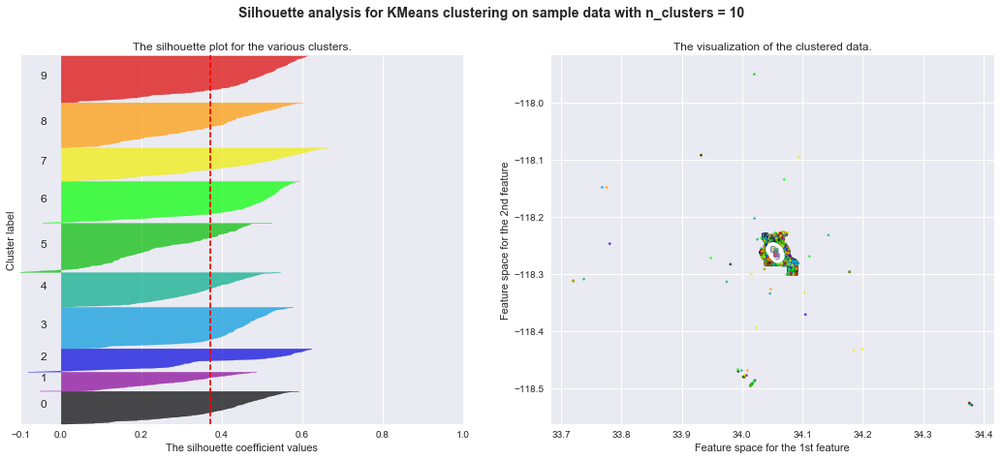

In [36]:
dfMatrix = df2015_reduced.as_matrix()
clusterScores = {}

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(dfMatrix) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(dfMatrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(dfMatrix, cluster_labels, sample_size = 1000)
    silhouette_avg = silhouette_score(dfMatrix, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    clusterScores[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfMatrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(dfMatrix[:, 0], dfMatrix[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [37]:
numIdeal = max(clusterScores, key=lambda i: clusterScores[i])
print("Il numero di cluster ideale è pari a",numIdeal,\
      "siccome ha un average silhouette score più alto di tutti e pari a",clusterScores[numIdeal])

Il numero di cluster ideale è pari a 3 siccome ha un average silhouette score più alto di tutti e pari a 0.402857443516


In [38]:
df2_2015 = pd.DataFrame(index=df2015.index)
df2_2015['Lat'] = df2015['Lat']
df2_2015['Lon'] = df2015['Lon']
df2_2015['Lat'] = pd.to_numeric(df2_2015['Lat'])
df2_2015['Lon'] = pd.to_numeric(df2_2015['Lon'])
df2_2015['Date-Time Occured'] = df2015['Date-Time Occured']
df2_2015['Time'] = df2015['Date-Time Occured'].dt.hour + (df2015['Date-Time Occured'].dt.minute/60) + (df2015['Date-Time Occured'].dt.second/3600)
df2_2015['Weekday'] = df2_2015['Date-Time Occured'].dt.dayofweek
df2_2015['Victim Age'] = df2015['Victim Age']
del df2_2015['Date-Time Occured']
df2_2015

,Lat,Lon,Time,Weekday,Victim Age
931844,34.0450,-118.2628,12.000000,6,114
932023,34.0540,-118.2620,0.016667,6,114
932180,34.0858,-118.2917,15.000000,1,114
967480,34.0542,-118.2717,22.000000,3,114
967521,34.0451,-118.2779,16.500000,4,22
968162,34.0583,-118.2616,0.166667,5,114
968860,33.7808,-118.2468,4.750000,3,114
969061,34.1034,-118.3325,10.500000,1,114
989578,34.0478,-118.2454,17.166667,4,114
989639,34.0479,-118.2612,20.000000,3,48


In [39]:
df2_2015.dtypes

Lat           float64
Lon           float64
Time          float64
Weekday         int64
Victim Age      int64
dtype: object

**NB. Due to problems related to the library *sklearn* we were forced to use only the 16% of the data. With more data the library it's not able calculate the silhouette scores.**

In [43]:
#in order to use clustering algorithm we had to use the 16% of the data
df2015_reduced = df2_2015.iloc[:int(len(df2_2015)/100)*16]
len(df2015_reduced)

8256

For n_clusters = 2 The average silhouette_score is : 0.47072494731


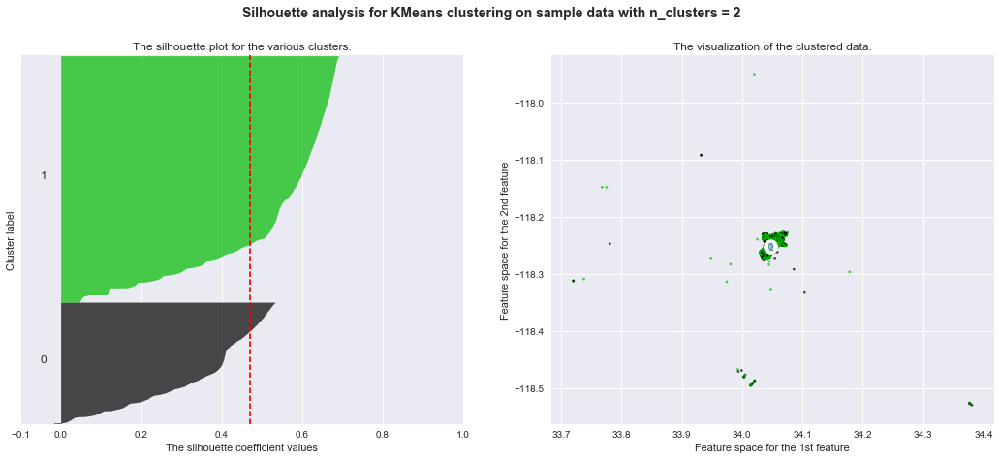

For n_clusters = 3 The average silhouette_score is : 0.485953510523


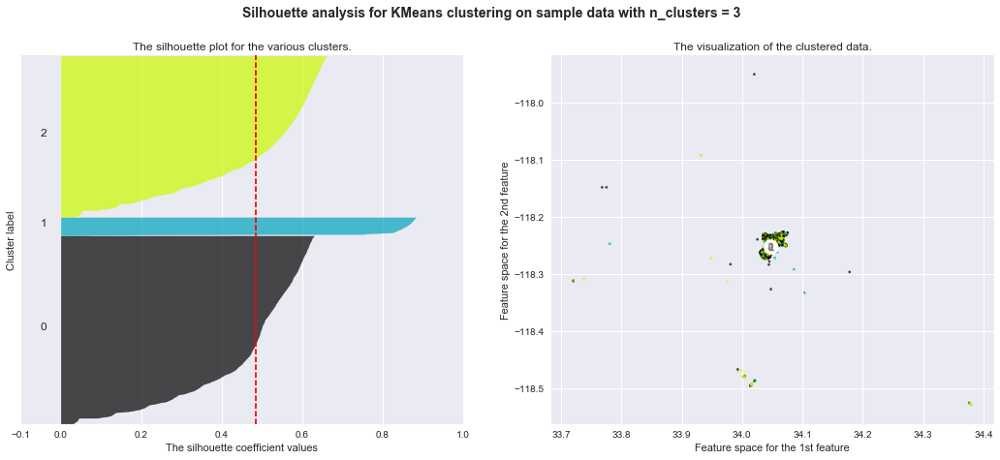

For n_clusters = 4 The average silhouette_score is : 0.47247028419


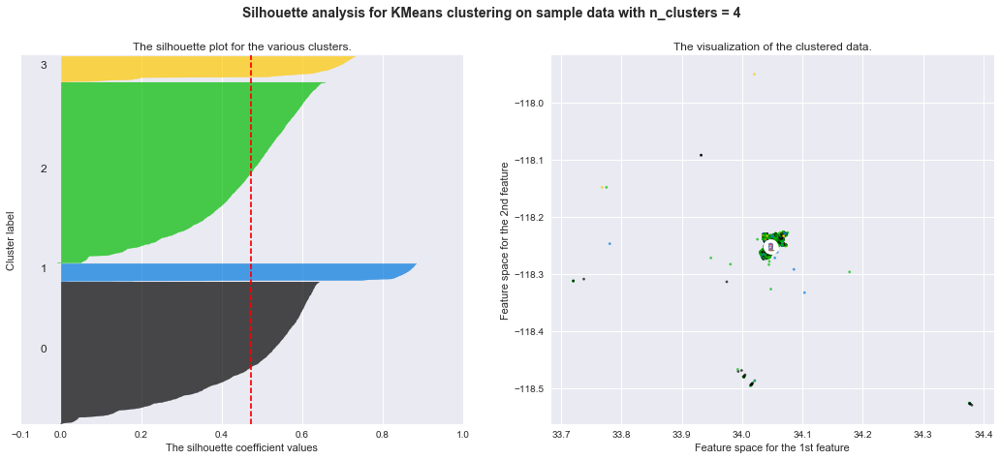

For n_clusters = 5 The average silhouette_score is : 0.394915253965


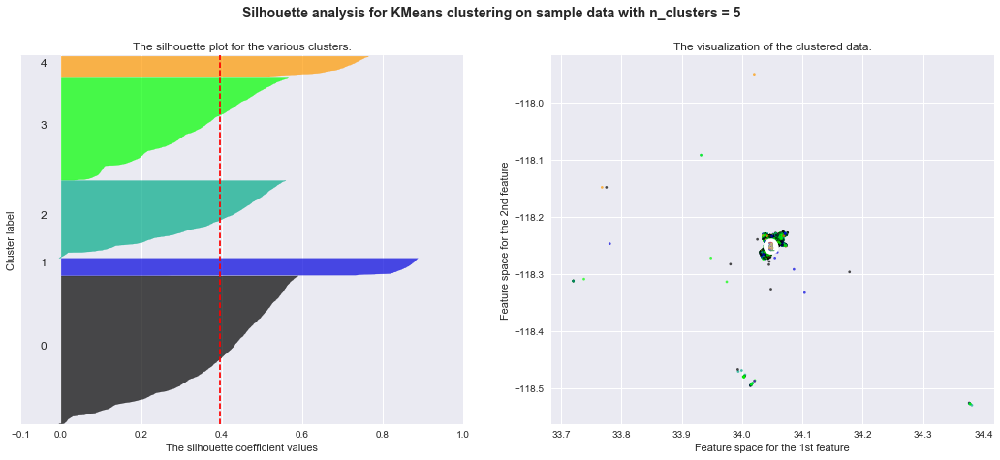

For n_clusters = 6 The average silhouette_score is : 0.388735426013


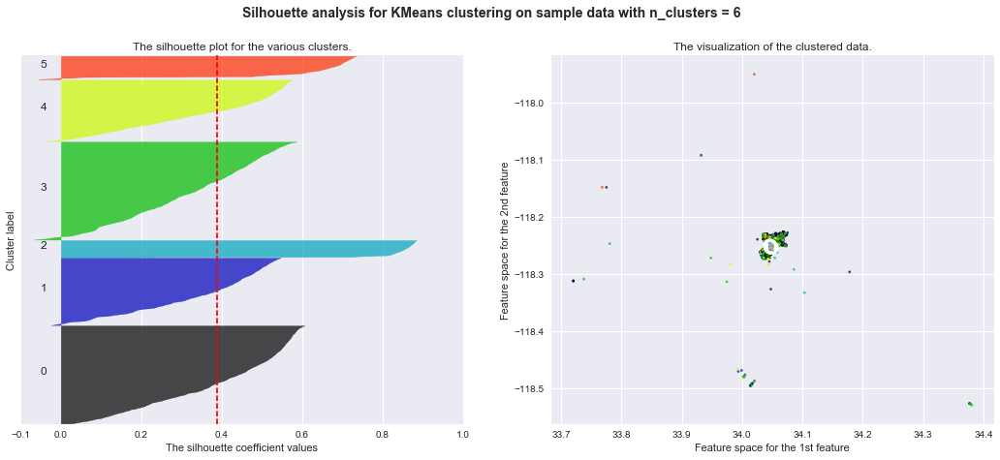

For n_clusters = 7 The average silhouette_score is : 0.379512875668


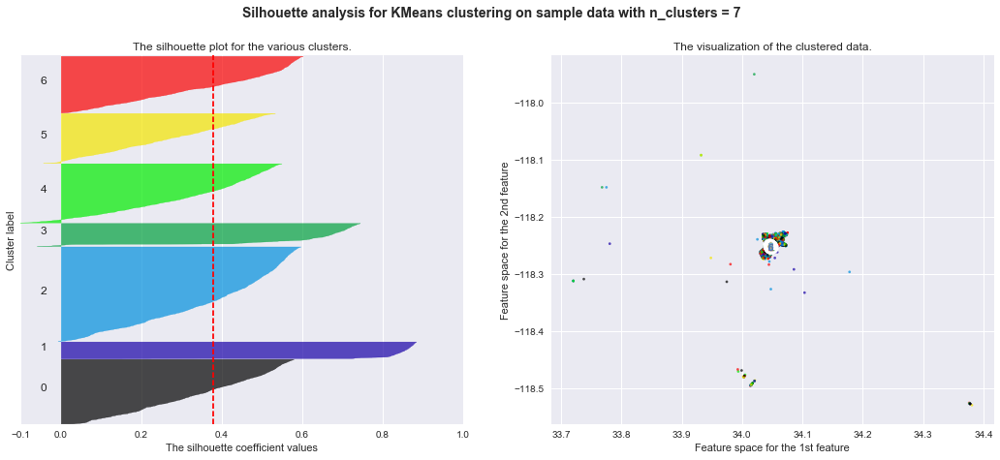

For n_clusters = 8 The average silhouette_score is : 0.373204336574


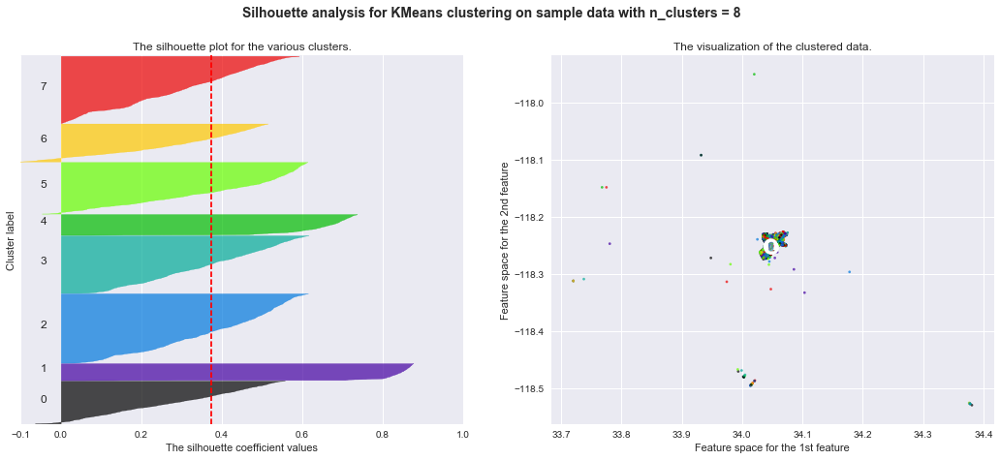

For n_clusters = 9 The average silhouette_score is : 0.367424488764


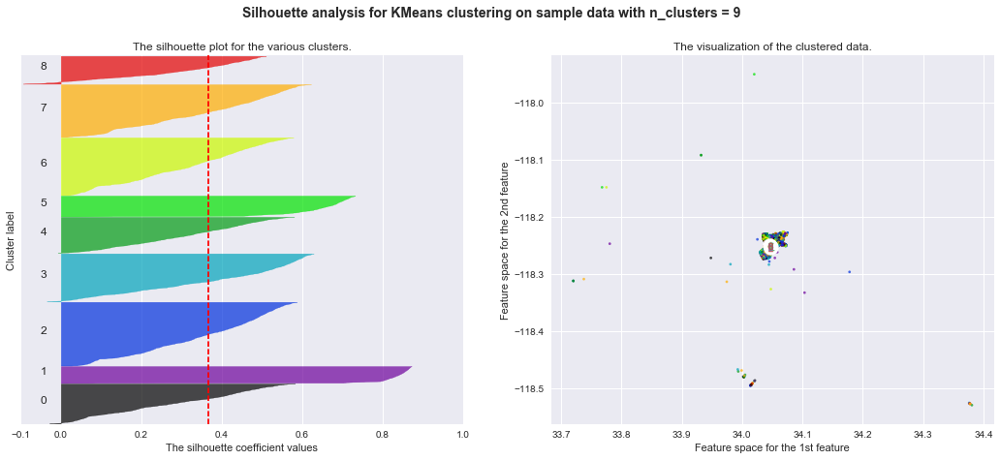

For n_clusters = 10 The average silhouette_score is : 0.358057391088


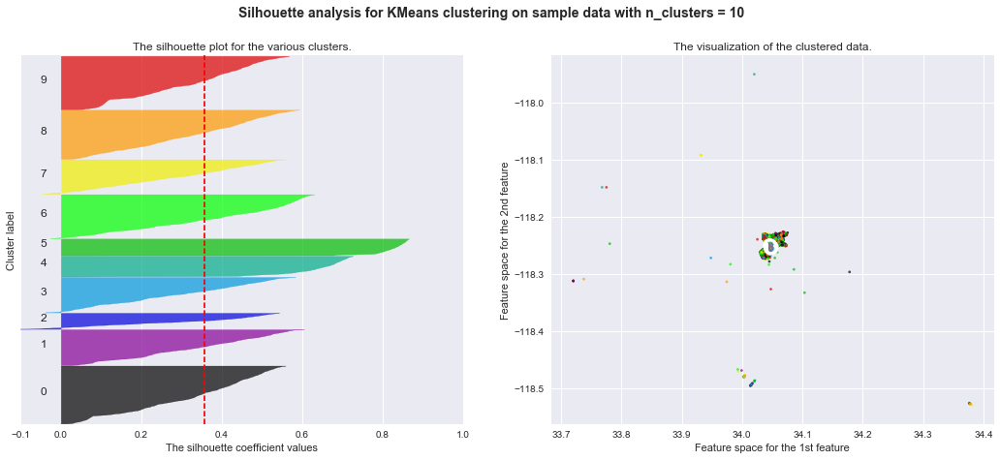

In [44]:
dfMatrix = df2015_reduced.as_matrix()
clusterScores = {}

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(dfMatrix) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(dfMatrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(dfMatrix, cluster_labels, sample_size = 1000)
    silhouette_avg = silhouette_score(dfMatrix, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    clusterScores[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfMatrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(dfMatrix[:, 0], dfMatrix[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [45]:
numIdeal = max(clusterScores, key=lambda i: clusterScores[i])
print("Il numero di cluster ideale è pari a",numIdeal,\
      "siccome ha un average silhouette score più alto di tutti e pari a",clusterScores[numIdeal])

Il numero di cluster ideale è pari a 3 siccome ha un average silhouette score più alto di tutti e pari a 0.485953510523


In [46]:
df2_2015 = pd.DataFrame(index=df2015.index)
df2_2015['Lat'] = df2015['Lat']
df2_2015['Lon'] = df2015['Lon']
df2_2015['Lat'] = pd.to_numeric(df2_2015['Lat'])
df2_2015['Lon'] = pd.to_numeric(df2_2015['Lon'])
df2_2015['Date-Time Occured'] = df2015['Date-Time Occured']
df2_2015['Time'] = df2015['Date-Time Occured'].dt.hour + (df2015['Date-Time Occured'].dt.minute/60) + (df2015['Date-Time Occured'].dt.second/3600)
df2_2015['Weekday'] = df2_2015['Date-Time Occured'].dt.dayofweek
df2_2015['Victim Sex'] = df2015['Victim Sex']
del df2_2015['Date-Time Occured']
df2_2015

,Lat,Lon,Time,Weekday,Victim Sex
931844,34.0450,-118.2628,12.000000,6,U
932023,34.0540,-118.2620,0.016667,6,U
932180,34.0858,-118.2917,15.000000,1,U
967480,34.0542,-118.2717,22.000000,3,U
967521,34.0451,-118.2779,16.500000,4,M
968162,34.0583,-118.2616,0.166667,5,U
968860,33.7808,-118.2468,4.750000,3,U
969061,34.1034,-118.3325,10.500000,1,U
989578,34.0478,-118.2454,17.166667,4,U
989639,34.0479,-118.2612,20.000000,3,M


In [47]:
df2_2015 = df2_2015.replace({'Victim Sex': sex_dict})
df2_2015

,Lat,Lon,Time,Weekday,Victim Sex
931844,34.0450,-118.2628,12.000000,6,3
932023,34.0540,-118.2620,0.016667,6,3
932180,34.0858,-118.2917,15.000000,1,3
967480,34.0542,-118.2717,22.000000,3,3
967521,34.0451,-118.2779,16.500000,4,1
968162,34.0583,-118.2616,0.166667,5,3
968860,33.7808,-118.2468,4.750000,3,3
969061,34.1034,-118.3325,10.500000,1,3
989578,34.0478,-118.2454,17.166667,4,3
989639,34.0479,-118.2612,20.000000,3,1


In [48]:
df2_2015.dtypes

Lat           float64
Lon           float64
Time          float64
Weekday         int64
Victim Sex      int64
dtype: object

**NB. Due to problems related to the library *sklearn* we were forced to use only the 35% of the data. With more data the library it's not able calculate the silhouette scores.**

In [51]:
#in order to use clustering algorithm we had to use the 35% of the data
df2015_reduced = df2_2015.iloc[:int(len(df2_2015)/100)*35]
len(df2015_reduced)

18060

For n_clusters = 2 The average silhouette_score is : 0.525578225393


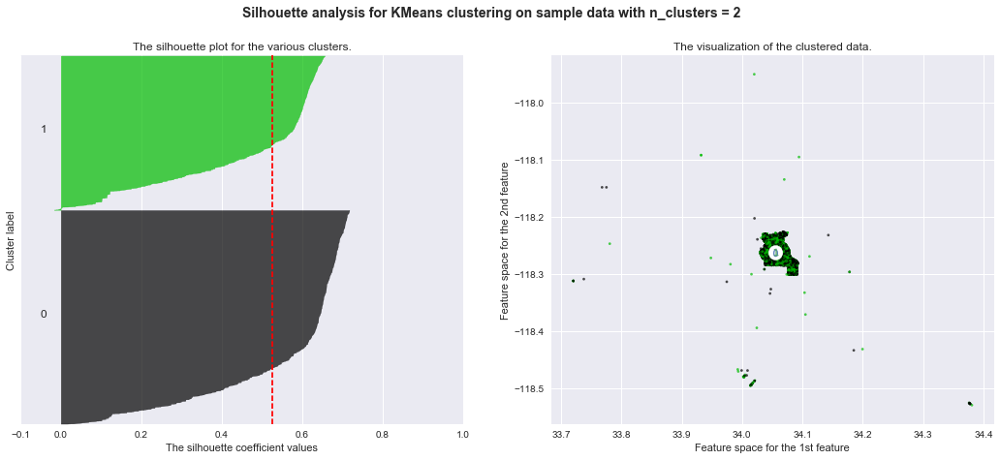

For n_clusters = 3 The average silhouette_score is : 0.472926028024


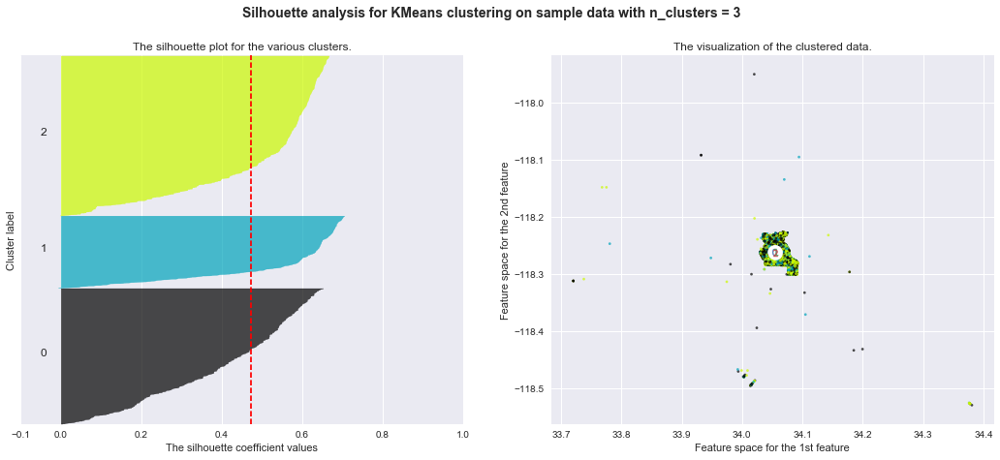

For n_clusters = 4 The average silhouette_score is : 0.396743969831


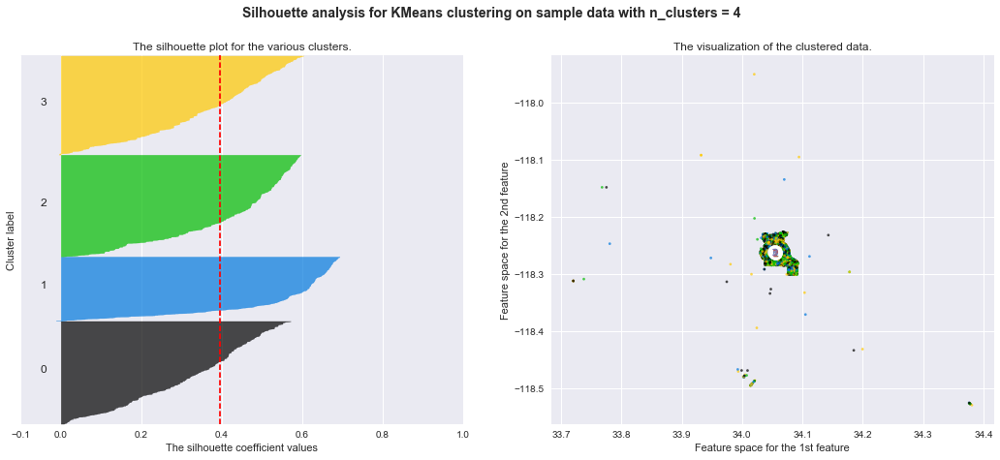

For n_clusters = 5 The average silhouette_score is : 0.347730374024


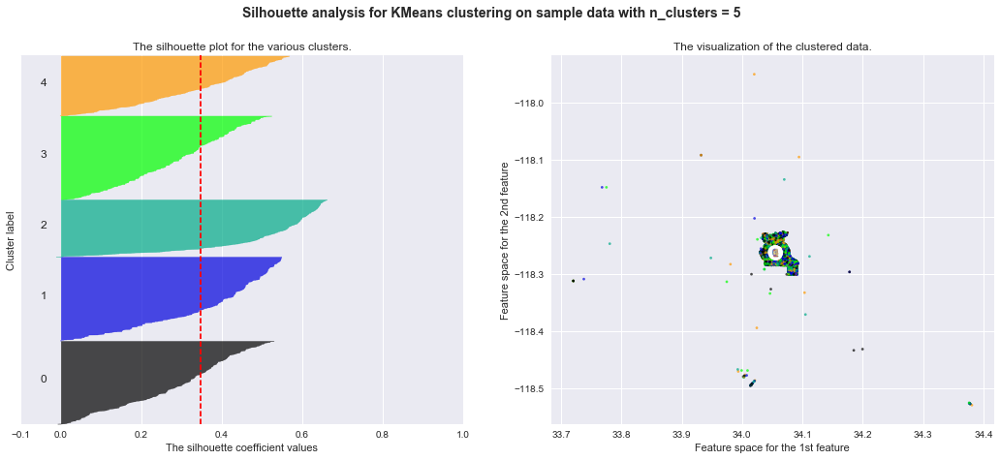

For n_clusters = 6 The average silhouette_score is : 0.34317435827


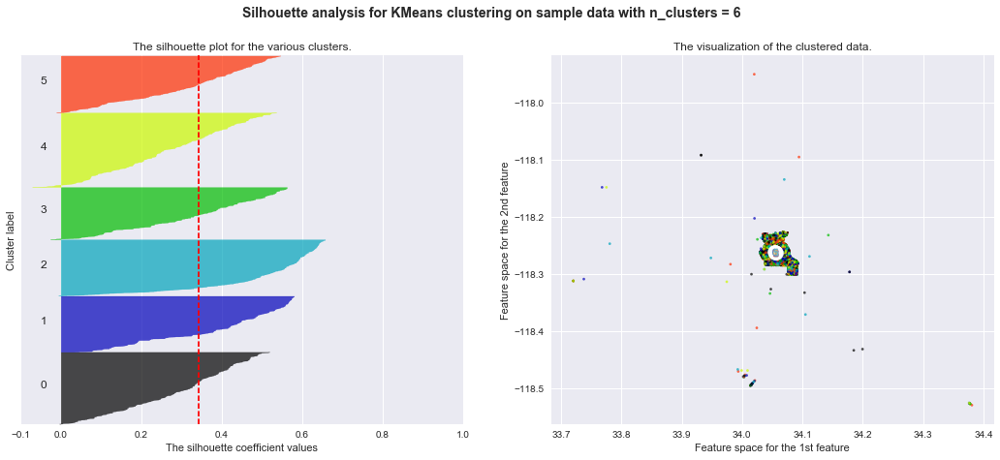

For n_clusters = 7 The average silhouette_score is : 0.364780644033


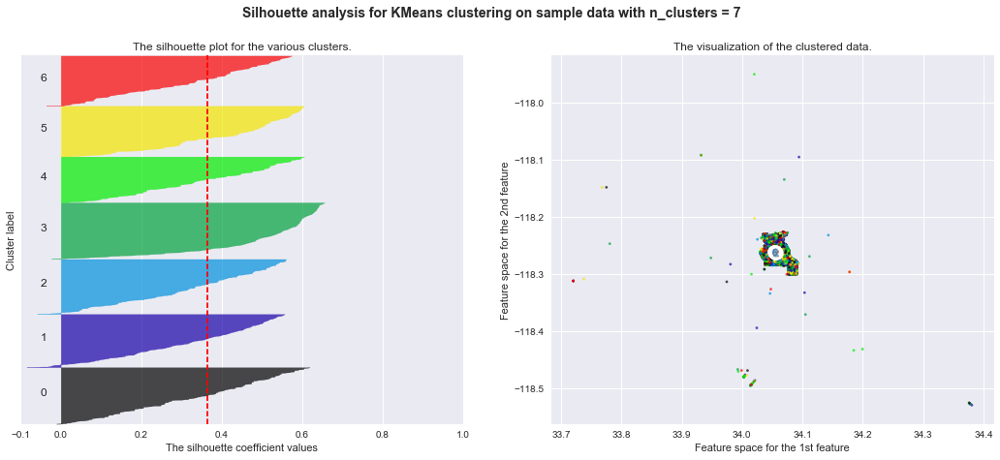

For n_clusters = 8 The average silhouette_score is : 0.359354440905


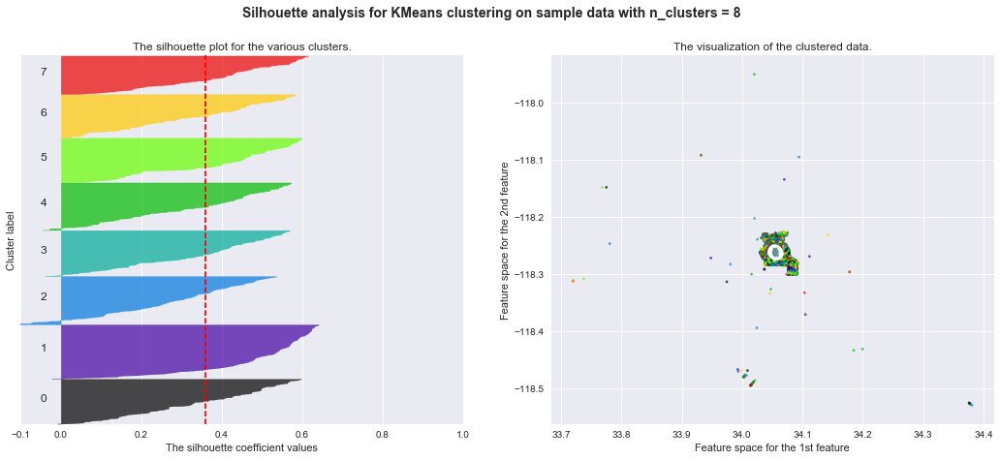

For n_clusters = 9 The average silhouette_score is : 0.350937386718


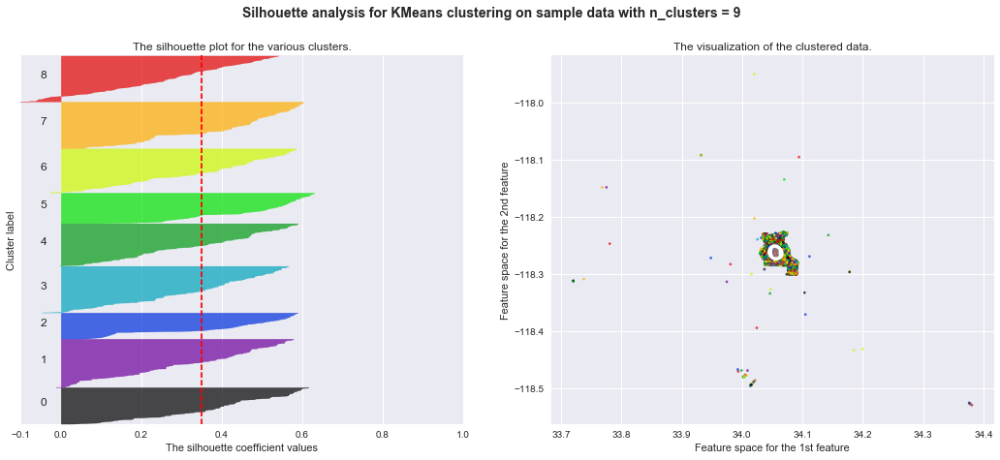

For n_clusters = 10 The average silhouette_score is : 0.356666912043


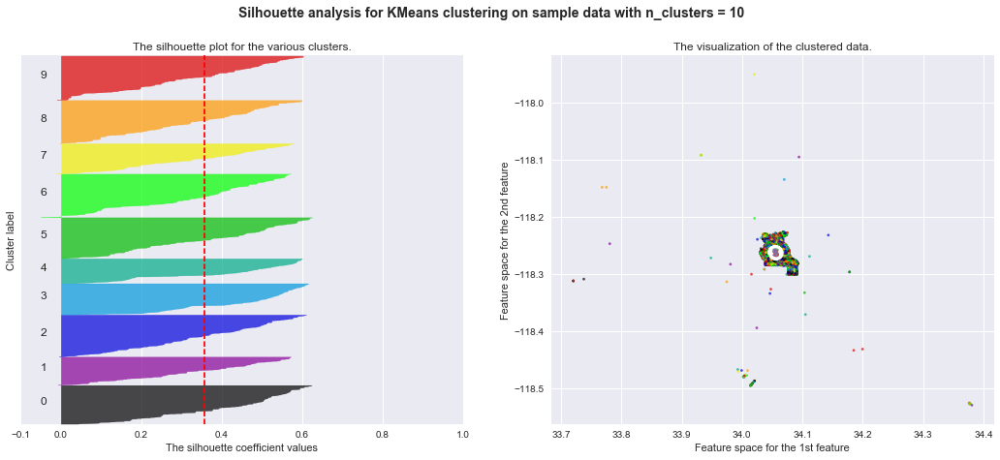

In [52]:
dfMatrix = df2015_reduced.as_matrix()
clusterScores = {}

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(dfMatrix) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(dfMatrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    #silhouette_avg = silhouette_score(dfMatrix, cluster_labels, sample_size = 1000)
    silhouette_avg = silhouette_score(dfMatrix, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    clusterScores[n_clusters] = silhouette_avg
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfMatrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(dfMatrix[:, 0], dfMatrix[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [53]:
numIdeal = max(clusterScores, key=lambda i: clusterScores[i])
print("Il numero di cluster ideale è pari a",numIdeal,\
      "siccome ha un average silhouette score più alto di tutti e pari a",clusterScores[numIdeal])

Il numero di cluster ideale è pari a 2 siccome ha un average silhouette score più alto di tutti e pari a 0.525578225393
